## DELE CA2 PART A : GENERATIVE ADVERSARIAL NETWORK WITH CIFAR-10

Team Members : Dario Prawara Teh Wei Rong (2201858) | Lim Zhen Yang (2214506)

### RESEARCH REFERENCES

1. https://towardsdatascience.com/on-the-evaluation-of-generative-adversarial-networks-b056ddcdfd3a#:~:text=One%20of%20the%20most,that%20can%20be%20reviewed.
2. https://www.techtarget.com/searchenterpriseai/definition/generative-adversarial-network-GAN
3. https://neptune.ai/blog/generative-adversarial-networks-gan-applications
4. https://machinelearningmastery.com/what-are-generative-adversarial-networks-gans/

### BACKGROUND RESEARCH & ANALYSIS

In the vast field of Deep Learning, the ultimate objective is to develop models capable of effectively capturing and representing various forms of data distributions. Throughout history, the remarkable success of discriminative models, which learn to differentiate and map high-dimensional data into lower-dimensional representations, has been evident (Goodfellow et al., 2014). For instance, tasks like Image Classification exemplify discriminative modeling, where high-dimensional images are transformed into low-dimensional probability distributions over labels.

But what about generative modeling? In generative modeling, the primary aim is quite different. Instead of merely classifying or mapping data, the goal is to learn from a given data distribution and generate entirely new examples that adhere to the same distribution while maintaining uniqueness. Consequently, a high-performing generative model must produce examples that are not only recognizable and plausible in their representation but also virtually indistinguishable from real data instances (Brownlee, 2019). The realm of generative models encompasses both Unsupervised and Semi-Supervised approaches, with the choice depending on the specific task at hand.

When working with Generative Models, there are 3 different alternatives to network architectures :

- Generative Adversarial Networks (GAN)
- Diffusion Models
- Variational Auto Encoders (VAE)

### WHAT IS A GAN AND WHAT IS INSIDE IT?

> A GAN, or Generative Adversarial Network, is essentially a deep learning model with two neural networks, the Generator and the Discriminator, which are trained together in a competitive manner. - **Introduced by Ian Goodfellow and his colleagues in 2014.**

GANs were then extended to a conditional model by conditioning both the generator and discriminator on some extra information in the 2014 Mehdi Mirza and Simon Osindero. "Conditional Generative Adversarial Nets" paper. By using a convolutional network to GANs, we got Convolutional GANs, or DCGANs. This paper also had many propositions to make the training of DCGANs stable. It created many interesting visual samples. 2015-11-19 | [Theory] Alec Radford et al. "Unsupervised Representation Learning with Deep Convolutional Generative Adversarial Networks".

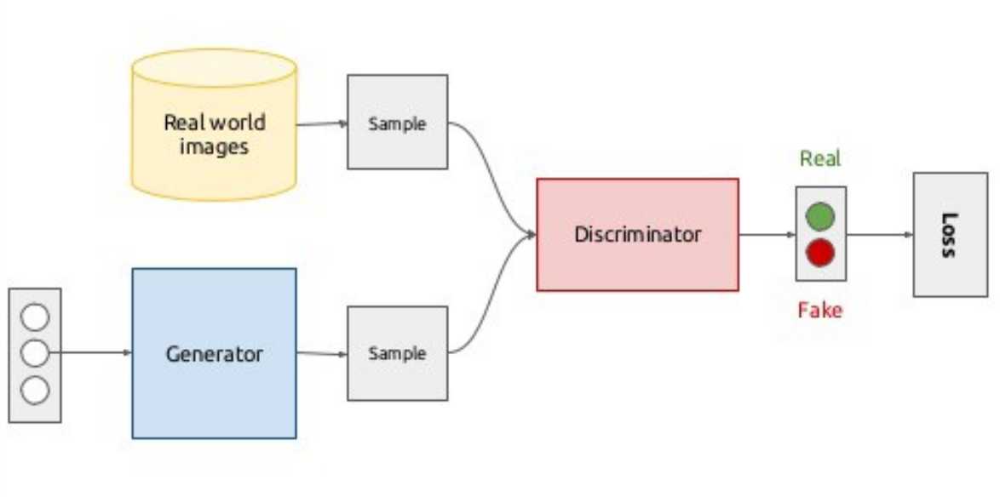

For GANs, the generator and discriminator have differing roles. While the generator's goal is to create realistic images that appear to be from the distribution of the training images, the discriminator's goal is to determine if a given image is from the data distribution. Here is how the process looks like:

1. Generator creates realistic images.
2. Discriminator learns to distinguish real vs fake from a set of real images and these newly generated images.
3. Using the updated Discriminator, Generator learns to trick the Discriminator.

Let's say we have some a random distribution or a "prior", which we can sample from. We can denote this as $p_z(z)$, where $z$ represents a vector of a specific size. This vector acts as the input to our generative model $G$. The model is ultimately described as $G(z; \theta_g)$ where $\theta_g$ represents the parameters of the generative model.

Meanwhile, our discriminator model $D$, takes in an input $x$, an image, which can be fully described as $D(x; \theta_d)$, where likewise, $\theta_d$ represents the parameters of the discriminative model. Being the discriminator, $D(x)$ returns the probability that an input $x$ is from the.

- This "game" between the two models can be thought of as trying to optimize of minimax function of:

$$\underset{G}{\text{min}}\underset{D}{\text{max}} V(D, G) = \mathbb{E}_{x \sim p_{\text{data}}(x)} [\text{log}D(x)] + \mathbb{E}_{z \sim p_{\text{z}}(z)} [\text{log}(1 - D(G(z)))]$$

<em>(Goodfellow et al., 2014)</em>

Essentially, the function $V$ takes in two inputs, our models $D$ and $G$, and returns an output that has two parts. The left hand part of the sum $\mathbb{E}_{x \thicksim p_{\text{data}}(x)} [\text{log}D(x)]$ represents "the expected value that the discriminator model predicts real data is real". The right hand part of the sum $\mathbb{E}_{z \thicksim p_{\text{z}}(z)} [\text{log}(1 - D(G(z)))]$ looks at given some random vector $z$, "what is the expected value that the discriminator model predicts fake data is fake", in that the value of the right hand part is maximum when discriminator model is successful at labeling the fake images of a generator as fake.

$\underset{G}{\text{min}}\underset{D}{\text{max}}$ aims to do two things. Firstly, what is the generator model $G$ that *minimizes the value*, which means *the discriminator labels generator's images as real*. Secondly what is the disciminator model $D$ that will maximize this value, which means **discriminator model predicts real images as real and fake images as fake**. These two perfectly optimize each other, when the best approach the discriminator can take is to <strong>just guess randomly</strong> as the generator images are on the same realism as the real data.

### APPLICATIONS OF GENERATIVE ADVERSARIAL NETWORKS

As GANs are generative models, there are a large number of applications of GANs (Brownlee, 2019). Below are a few areas where GANs can be applied to :

- Time Series
- Image Generation
- Audio / Music Generation
- Style Transfer Application (E.g. Winter Photo to Summer Photo)

### OUR PROJECT OBJECTIVE

Before we begin our analysis, let us take a look at our project's objective.

> Apply some suitable GAN architectures to the problem of image generation using the CIFAR-10 dataset and generate 1000 snall colour images.

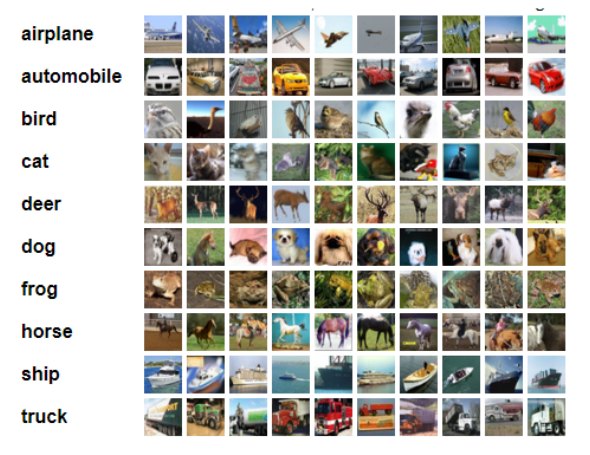

The CIFAR-10 dataset consists of **60000** `32x32` colour images in a total of 10 classes, with 6000 images per class (Krizhevsky, 2009).

### DEVELOPING THE GAN MODELS

> Let's get down to building our Conditional GANs.

Why Conditional GANs? As mentioned during the above background research section, Conditional GANs are. On top of this, Conditional GANs allow the user to **control** the output.

Besides, if one appreciates the idea of not knowing what a Vanilla GAN may output, a simple random module can be attached as the conditional information to somewhat hack the Conditional GAN into being a normal GAN.

### WHAT WILL BE DONE FOR GAN

Here, we will identify the tasks and objectives we want to meet, which will be used as a guide throughout the development of our GAN models.

1. Explore the CIFAR-10 Dataset (EDA / Feature Engineering)
2. Implement and Evaluate to find the Best Performing Model
3. Make Model Improvements
3. Analyse the Final Model and Make Conclusions

### INITIALIZING MODULES AND LIBRARIES

- Import necessary libraries for pre-processing, data exploration, feature engineering and model evaluation.

- Some libraries used include tensorflow, matplotlib, and scikit-learn.

In [140]:
# Deep Learning Libraries for Model Building
import tensorflow as tf
from tensorflow.data import Dataset
from IPython.display import display

# Data Processing and Splitting Libraries
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
import scipy
from keras.utils import to_categorical

# Utility and Miscellaneous Libraries
import logging
from datetime import datetime
import os
import math
from tqdm import tqdm
from scipy.linalg import sqrtm
import tensorflow_probability as tfp

# Import TensorFlow and Keras
import tensorflow as tf
from tensorflow import keras
from tensorflow.data import Dataset
from tensorflow.keras import backend as K
from keras.applications.inception_v3 import InceptionV3, preprocess_input
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import (
    Input, Dense, Conv2D, Conv2DTranspose, Embedding, Reshape, Flatten,
    Dropout, BatchNormalization, ReLU, LeakyReLU, MaxPooling2D, Concatenate,
    PReLU
)
from tensorflow.keras.losses import BinaryCrossentropy, SparseCategoricalCrossentropy
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import Metric
from tensorflow.keras.callbacks import Callback
from tensorflow.keras.utils import plot_model
from keras.callbacks import Callback
from tensorflow_addons.layers import SpectralNormalization
from keras.initializers import RandomNormal

# Import Libraries for Scoring Metrics
from math import floor
from numpy import ones
from numpy import expand_dims
from numpy import log
from numpy import mean
from numpy import std
from numpy import exp
from numpy.random import shuffle
from keras.applications.inception_v3 import InceptionV3
from keras.applications.inception_v3 import preprocess_input
from keras.datasets import cifar10
from skimage.transform import resize
from numpy import asarray
from numpy import cov
from tensorflow.python.ops.numpy_ops import np_config
np_config.enable_numpy_behavior()
import glob
import imageio
from IPython.display import HTML

# Ignore warnings
import warnings
warnings.filterwarnings("ignore")

### PERFORM CHECK FOR GPU

- Ensure GPU can be found when using tf.config and list_physical_devices.
- Avoid OOM errors by setting GPU memory consumption growth.

In [2]:
# Avoid OOM errors by setting GPU Memory Consumption Growth
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)
    
# Show the GPU
gpu

PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')

### SETTING RANDOM SEED FOR REPRODUCTIBILITY

- To ensure reproductibility of results, we will be setting random seed to ensure results are reproducible.

In [3]:
tf.random.set_seed(42)

### SETTING CHART CUSTOMIZATIONS FOR EDA

- Before loading the CIFAR-10 dataset of colored images, we will be setting chart customizations in Seaborn to ensure a consistent and uniformed layout for our charts in this notebook.

In [4]:
# Change theme of charts
sns.set_theme(style='darkgrid')

# Change font of charts
sns.set(font='Century Gothic')

# Variable for color palettes
color_palette = sns.color_palette('muted')

### LOADING AND IMPORTING THE CIFAR-10 DATASET

- We will be importing the Cifar-10 Dataset using Keras datasets with this line of code `tf.keras.datasets.cifar10.load_data()` to load the data in.
- First, we will visualize the shape of the data by unpacking it into the training and testing sets respectively.

In [5]:
# Load the dataset and unpack it into training and testing data
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()

# Print the shapes of the data
print(f"Training Data:\nX_train shape: {x_train.shape}, y_train shape: {y_train.shape}")
print(f"\nTesting Data:\nX_test shape: {x_test.shape}, y_test shape: {y_test.shape}")
print(f"\nNumber of Class Labels: {len(np.unique(y_train))}")

Training Data:
X_train shape: (50000, 32, 32, 3), y_train shape: (50000, 1)

Testing Data:
X_test shape: (10000, 32, 32, 3), y_test shape: (10000, 1)

Number of Class Labels: 10


**WHAT CAN WE SEE FROM THE CIFAR-10 DATASET IMPORT?**

- From our results, we see that there are a total of `60000 rows` for both the training and testing data combined.
- In the X variables, we also see that each image is a **32 x 32 image with a 3 color channel (RGB)**. This indicates that the images provided are colored images.

**DEFINING X AND Y VARIABLES WITH TRAIN DATA**

- Since testing of GANs typically involves generating new images without the need of a separate test data set, we will only be using the training set to train our GAN models, which consists of 50000 rows.

**So, we will be using X and y for training of our GAN models:**

X : uint8 NumPy array of coloured image data with shapes (50000, 32, 32, 3). Pixel values range from 0 to 255.

y : uint8 NumPy array of labels (integers in range 0-9) with shape (50000, 1).

In [6]:
# Concatenating the train and test data into X and y
X = x_train
y = y_train

print(f"X shape: {X.shape}")
print(f"y shape: {y.shape}")

X shape: (50000, 32, 32, 3)
y shape: (50000, 1)


### CHECKING FOR NULL VALUES IN THE DATASET

- Now, we will be checking for any null values using `.isnull()`.
- From our analysis, we can see that there are no null values in both X and y. Hence, we will be proceeding with EDA.

In [7]:
# Checking for any NULL values
def check_for_nulls(data, name):
    if np.isnan(data).any():
        print(f"There are null values in {name}.")
    else:
        print(f"There are 0 null values in {name}.")

check_for_nulls(X, "X")
check_for_nulls(y, "y")

There are 0 null values in X.
There are 0 null values in y.


### EXPLORATORY DATA ANALYSIS

- Now, we will move on to conducting exploratory data analysis of the data, to gain a better understanding of what we can find in the dataset and its characteristics.

In this section, we will be exploring class distribution, pixel distribution and others. Here is what will be covered in our EDA process:

1. Visualizing the Image Dataset
2. Visualizing the Class Distributions
3. Visualizing Class Colour Distributions
3. Visualizing Image Pixel Distribution
4. Image Averaging

Each number represents a different item in the CIFAR-10 dataset :

<table width="40%" align="left" style="text-align: right;">
    <tr>
        <th>Class (0 - 9)</th>
        <th>Labels</th>
    </tr>
    <tr>
        <td>0</td>
        <td>Airplane</td>
    </tr>
    <tr>
        <td>1</td>
        <td>Automobile</td>
    </tr>
    <tr>
        <td>2</td>
        <td>Bird</td>
    </tr>
    <tr>
        <td>3</td>
        <td>Cat</td>
    </tr>
    <tr>
        <td>4</td>
        <td>Deer</td>
    </tr>
    <tr>
        <td>5</td>
        <td>Dog</td>
    </tr>
    <tr>
        <td>6</td>
        <td>Frog</td>
    </tr>
    <tr>
        <td>7</td>
        <td>Horse</td>
    </tr>
    <tr>
        <td>8</td>
        <td>Ship</td>
    </tr>
    <tr>
        <td>9</td>
        <td>Truck</td>
    </tr>

First, let us define our class labels that can be found in our dataset before we proceed with visualizing the images in our data.

In [8]:
# Instantiating the class labels of our dataset
class_labels = {
    0: 'Airplane',
    1: 'Automobile',
    2: 'Bird',
    3: 'Cat',
    4: 'Deer',
    5: 'Dog',
    6: 'Frog',
    7: 'Horse',
    8: 'Ship',
    9: 'Truck'
}

**1.1 VISUALIZING THE IMAGE DATASET - CIFAR-10**

From the images generated, we can see that all the images below are correctly labelled. Visually, although the images are **quite blurry** due to the image size being `32x32`, it is still easy to tell the diffference between the classes. 

However, upon further inspection, we see that there may be some problems our models could face when generating the images.

- **Diverse Variety of Animal Species** : Aside from automobiles and vehicles, the dataset contains a wide range of animal species, including birds like ostriches and sparrows. This diversity presents a challenge as the model might not be able to clearly differentiate the different species and generate an amalgamation instead.
<br>

- **Image Zoom Levels** : Another challenge lies with the variation in image zoom levels. Many images exhibit different sizes, particularly for cats and dogs. Some images are tightly focused on the animal's face, while others are more zoomed out, capturing the entire body of the animal. This variation in zoom levels can impact the model's ability to maintain consistent image generation quality.

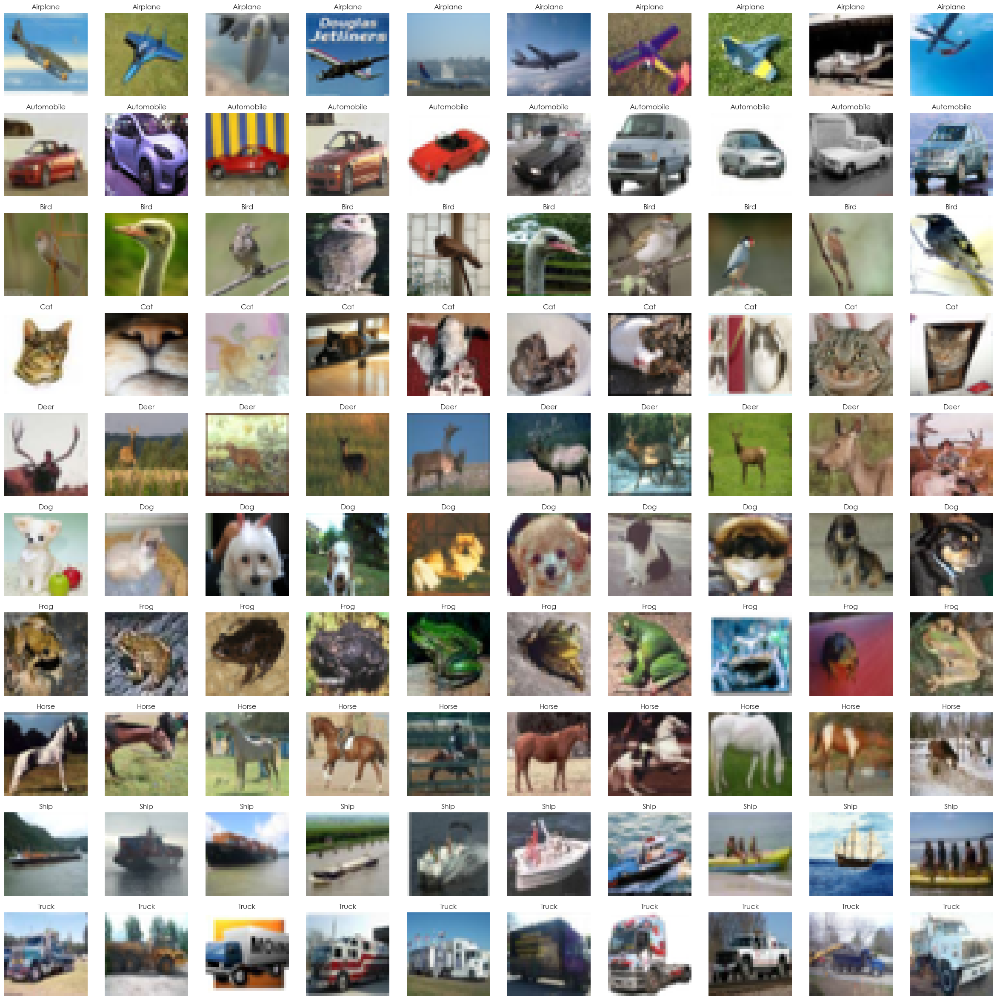

In [9]:
# Visualizing a subset of the CIFAR-10 Dataset
fig, ax = plt.subplots(10, 10, figsize=(30, 30))

for i in range(10):
    images = X[np.squeeze(y == i)]
    random_index = np.random.choice(images.shape[0], 10, replace=False)
    images = images[random_index]
    label = class_labels[i]
    
    for j in range(10):
        subplot = ax[i, j]
        subplot.axis("off")
        subplot.imshow(images[j])
        subplot.set_title(label)

plt.show()

**1.2 VISUALIZING THE CLASS DISTRIBUTIONS**

- When training deep learning models, it is crucial to check the distribution of the image classes in the dataset, enabling us to understand the best metrics to use and evaluate if anything is needed to balance the classes.

Airplane: 5000
Automobile: 5000
Bird: 5000
Cat: 5000
Deer: 5000
Dog: 5000
Frog: 5000
Horse: 5000
Ship: 5000
Truck: 5000


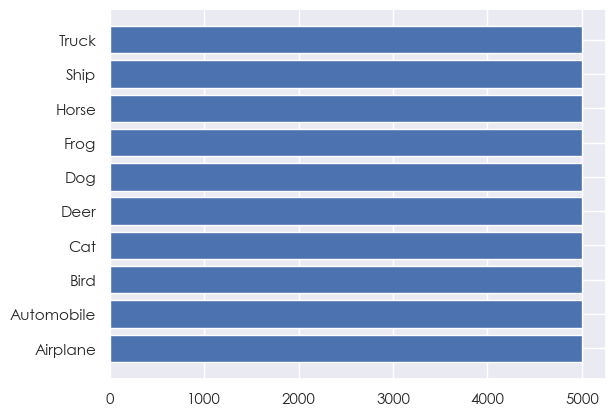

In [10]:
# Visualizing class distributions in the dataset

# Count the images for each label
labels, counts = np.unique(y, return_counts = True)
for label, count in zip(labels, counts):
    print(f"{class_labels[label]}: {count}")
    
# Display a barchart displaying the counts
plt.barh(labels, counts, tick_label=list(class_labels.values()))
plt.show()

**ANALYSIS OF THE CLASS DISTRIBTIONS**

From the bar graph and count displayed, it is apparent that there is a **no imbalance at all** found in the data with all classes containing exactly `5000 images`, and the distribution of the image classes are even. Hence, this shows no class resampling will be needed as there is no particular bias to any specific class.

**1.3 VISUALIZING CLASS COLOR DISTRIBUTIONS**

- Our models see these images differently from humans, they only understand the numbers, specifically they "see" these images as numbers/pixel values. 
- Our model will take in training examples and noise from some distribution to learn a transformation to the data distribution. Hence, viewing each classes distribution can help us understand and visualize what our model will be trying to learn.

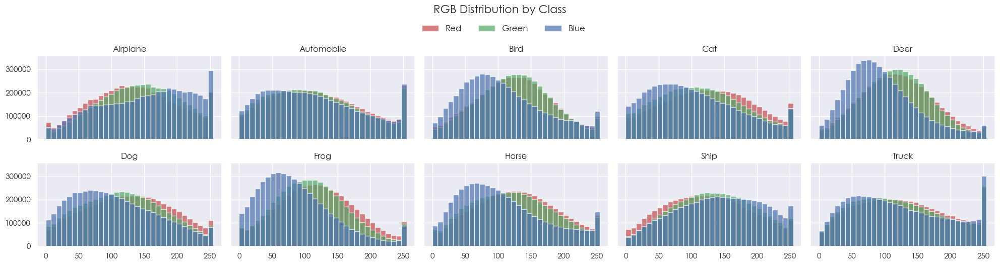

In [11]:
bins = 32

fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(20, 5), sharex=True, sharey=True)

n_labels = len(np.unique(y))

for i, ax in zip(range(n_labels), axes.flat):
    idx = np.where(y == i)[0]
    ax.hist(X[idx, ..., 0].ravel(), bins=bins, color='r', alpha=.7)
    ax.hist(X[idx, ..., 1].ravel(), bins=bins, color='g', alpha=.7)
    ax.hist(X[idx, ..., 2].ravel(), bins=bins, color='b', alpha=.7)
    ax.set_title(class_labels[i])

fig.legend(['Red', 'Green', 'Blue'], loc='upper right', fontsize=12, ncol=3, bbox_to_anchor=(0.592, 1.0), frameon=False)
fig.suptitle('RGB Distribution by Class', fontsize=16, y=1.05)
plt.tight_layout()
plt.show()

**1.4 VISUALIZING IMAGE PIXEL DISTRIBUTION**

- In this section, we will visualize the pixel intensity and find out the distribution of the pixel values.
- To visualize it, we will plot the distribution of brightness to evaluate the distribution of pixel values.

In [12]:
# Visualizing the pixel values
print("Pixel Values:")
print("Max: ", np.max(X))
print("Min: ", np.min(X))

# Calculating the mean and standard deviation of the pixels
print("\nMean and Standard Deviation of Pixels for Images:")
print("Mean: ", np.mean(X, axis = (0, 1, 2)))
print("Standard Deviation: ", np.std(X, axis = (0, 1, 2)))

Pixel Values:
Max:  255
Min:  0

Mean and Standard Deviation of Pixels for Images:
Mean:  [125.30691805 122.95039414 113.86538318]
Standard Deviation:  [62.99321928 62.08870764 66.70489964]


**ANALYSIS OF THE PIXEL DISTRIBUTIONS**

**<u>Pixel Value</u>**<br>
Based on the pixel values, as expected, the pixel distribution ranges from 0 to 255 for colored images.

**<u>Mean Pixel Value</u>**<br>
The mean pixel values represent the average brightness for each color channel (red, green, blue) across all images in the CIFAR-10 dataset. Since the red channel has the highest mean value, it suggests that our images tend to have brighter red colors on average. Meanwhile, the blue has the lowest mean value, indicating that blue colors are less intense on average.

**<u>Standard Deviation Pixel Value</u>**<br>
The standard deviation measures the spread or variability of pixel intensities within each color channel. Since the blue channel has the highest STD, it indicates that there is a greater variability in its pixel values. However, with green having the lowest variation, it suggests that the green channel has slightly more consistency in pixel values.

**1.5 IMAGE AVERAGING OF PIXELS**

We will now perform image averaging. This involves stacking of multiple photos on top of each other and averaging them together. We do this to see the noise of the image as well as observe all images in the dataset.

- From our image averaging, we observe that there is **no significance in the average of all images** and cannot make anything out from the image, likely due to the color of the images overlaying each other to give this blur effect.
- However, if looked closely at, one can see that there is a slight tinge of red color in the middle of the frame (nearly unnoticeable), which is likely due to the red channel having the highest mean value so the images have brighter red colors on average.

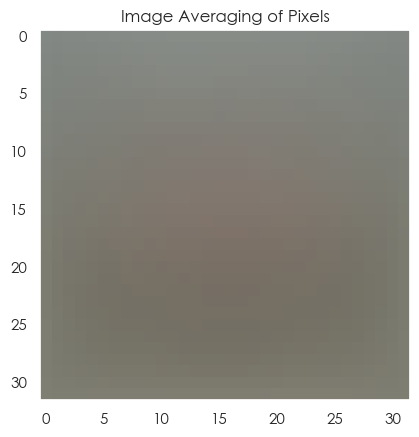

In [13]:
# Displaying the image averaging of all images combined
plt.imshow(np.mean(X, axis=0) / 255)
plt.grid(False) 
plt.title('Image Averaging of Pixels')
plt.show()

Now, we will be viewing the **average image among each of the classes**. First, we will split by the classes before finding the average among each of the classes.

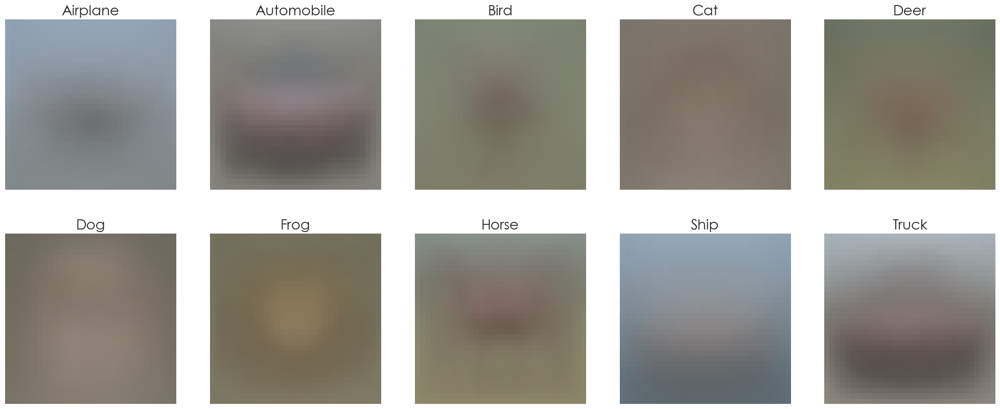

In [14]:
# Creating the image averaging
fig, ax = plt.subplots(2, 5, figsize=(25, 10))

for idx, subplot in enumerate(ax.ravel()):
    avg_image = np.mean(X[np.squeeze(y == idx)], axis=0) / 255
    subplot.imshow(avg_image)
    subplot.set_title(f"{class_labels[idx]}", fontsize=20)
    subplot.axis("off")

plt.show()

**ANALYZING THE AVERAGE IMAGE FOR EACH CLASS LABEL**

- When examining the average images for each class, we can see that the average images are blurry and unclear. However, we can still make out the images of an automobile, horse and truck **fairly clearly**. 
- One interesting fact to note is that the average horse image seems to have a more dominant presence when it faces the left, which is quite intriguing.
- However, for most of the classes, while we are able to make out some form of contour in the center of the image, it is still very pixelated and extremely blurry.

### FEATURE ENGINEERING AND PREPARATION OF DATA

Now, after performing EDA, we will be working on feature engineering to further prepare the data for model building. In this section, we will be looking into normalization and transforming the X and y data. Below are the steps we will work on:

- Converting to TensorFlow Dataset & Normalizing Images to [-1, 1]
- Creating a Batch of Real Images

**CONVERTING TO TF DATASET AND NORMALIZING IMAGES**

- We need to normalize our images to the [-1, 1] range as our generators will be using the `tanh()` activation function.
- We use the TensorFlow `Dataset` function to store X and y as tensor slices.

In [11]:
BUFFER_SIZE = 10_000
BATCH_SIZE = 128

dataset = tf.data.Dataset.from_tensor_slices((X, y))
dataset = dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

# Normalize images to range [-1, 1] as generator will be using tanh activation
dataset = dataset.map(lambda x, y: (tf.cast(x, tf.float32) / 127.5 - 1, y))
image_spec, label_spec = dataset.element_spec 

print(type(image_spec))
print(image_spec)
print(label_spec)

<class 'tensorflow.python.framework.tensor_spec.TensorSpec'>
TensorSpec(shape=(None, 32, 32, 3), dtype=tf.float32, name=None)
TensorSpec(shape=(None, 1), dtype=tf.uint8, name=None)


**INSPECT THE SHAPE OF INPUT IMAGES AND LABELS IN EACH DATA BATCH**

- Upon inspection, we see that the batch sizes are indeed 128, and the images are within the size `32, 32, 3`, indicating that the batch processing and normalization of images was successful.

In [12]:
for batch in dataset.take(1):
    image, label = batch
    print(f'Image shape: {image.shape}')
    print(f'Label shape: {label.shape}')

Image shape: (128, 32, 32, 3)
Label shape: (128, 1)


**CREATING A BATCH OF REAL IMAGES**

- For this step, we do it as it will be used later for the computation of our FID scores, hence we will process the data here and apply it in the later stages of the notebook.

In [13]:
# Create an iterator for the dataset and get one batch of images
iterator = iter(dataset)
one_batch = next(iterator)

# Split the batch into images and labels
images, labels = one_batch

# Convert the images to a NumPy array
real_images = images[:100]
real_images.shape

TensorShape([100, 32, 32, 3])

### MODEL BUILDING AND DEVELOPMENT

To solve this GAN task, we will be making use of a few GAN architectures.

- DCGAN - Deep Convolutional Generative Adversarial Network - Baseline 
- cDCGAN - Conditional Generative Adversarial Network + Gradient Tape
- SNGAN - Spectral Normalization GAN
- ACGAN - Auxilliary Classifier Generative Adversarial Network

Before building our models, we will discuss our evaluation techniques and how we will assess our model performance.

### MODEL EVALUATION METHODS AND TECHNIQUES

There are many model evaluation models and techniques for GAN. In this analysis, we will mainly be looking at 3 types of evaluations.

**<u>Manual GAN Evaluation</u>**

Manually inspecting and judging the generated examples from different iteration steps. However, there are a few limitations to this method :

1. It is subjective and includes the biases of the reviewer.
2. It requires domain knowledge to tell what is realistic and what is not. In our specific case, it is extremely important to count on the aid of dermatologists who can assess the fake examples.
3. It is limited in terms of the number of images that can be reviewed.
4. It cannot be used for early stopping.

**<u>Qualitative GAN Evaluation</u>**

By identifying non numerical data in the images, we are able to use human subject evaluation or evaluation via comparison. Some techniques include using :

1. Nearest Neighbors - Detect overfitting, generated samples are shown next to nearest neighbour in the training set
2. Rapid Scene Categorization - Get participants to help classify real and fake data

**<u>Quantitative GAN Evaluation</u>**

Evaluating GAN on quantitative means refers to using a specific calculation of specific numerical scores, used to summarize the general quality of the images. Some metrics used will include :

1. Fréchet Inception Distance - Measures the Fréchet distance between two multivariate Gaussian distributions fitted to the feature representations of real and generated samples.
2. Inception Score - Measure of how realistic the generated image is.
3. Kullback-Leibler Divergence (KL D) - Measures the distance between two statistical probability.

**For the case of this analysis, we will mainly be using qualitative and quantitative GAN evaluation strategies to analyse the performance of our models.**

### DEFINING EVALUATION FUNCTIONS AND CLASSES FOR MODEL BUILDING

Now, we will be defining evaluation functions to be used for model building later on. Some functions and classes developed include :

- Computing the FID Score and Inception Score
- Plotting the Loss and FID Metrics
- Storing the FID and IS results for each model

In [105]:
# Scale an array of images to a new size
def scale_images(images, new_shape):
    images = images.numpy()
    images_list = list()
    for image in images:
        image = (image + 1) * 127.5  # Reverse tanh normalization
        # Resize with nearest neighbor interpolation
        new_image = resize(image, new_shape, 0)
        # Store
        images_list.append(new_image)
    return asarray(images_list)

# Function to calculate Inception Score
def calculate_inception_score(images, n_split=10, eps=1E-16):
    # Load InceptionV3 model
    model = InceptionV3()
    # Enumerate splits of images/predictions
    scores = list()
    n_part = floor(images.shape[0] / n_split)
    for i in range(n_split):
        # Retrieve images
        ix_start, ix_end = i * n_part, (i + 1) * n_part
        subset = images[ix_start:ix_end]
        # Convert from uint8 to float32
        subset = subset.astype('float32')
        # Scale images to the required size
        subset = scale_images(subset, (299, 299, 3))
        # Pre-process images, scale to [-1, 1]
        subset = preprocess_input(subset)
        # Predict p(y|x)
        p_yx = model.predict(subset)
        # Calculate p(y)
        p_y = expand_dims(p_yx.mean(axis=0), 0)
        # Calculate KL divergence using log probabilities
        kl_d = p_yx * (log(p_yx + eps) - log(p_y + eps))
        # Sum over classes
        sum_kl_d = kl_d.sum(axis=1)
        # Average over images
        avg_kl_d = mean(sum_kl_d)
        # Undo the log
        is_score = exp(avg_kl_d)
        # Store
        scores.append(is_score)
    # Average across images
    is_avg, is_std = mean(scores), std(scores)
    return is_avg, is_std

# Function to calculate Frechet Inception Distance
def calculate_fid(fake_images):
    model = InceptionV3(include_top=False, pooling='avg', input_shape=(299, 299, 3))

    iterator = iter(dataset)
    one_batch = next(iterator)
    real_images, _ = one_batch
    real_images = real_images[:100]

    # Calculate activations
    real_images = real_images.astype('float32')
    fake_images = fake_images.astype('float32')

    real_images = scale_images(real_images, (299, 299, 3))
    fake_images = scale_images(fake_images, (299, 299, 3))

    real_images = preprocess_input(real_images)
    fake_images = preprocess_input(fake_images)

    act1 = model.predict(fake_images)
    act2 = model.predict(real_images)
    # Calculate mean and covariance statistics
    mu1, sigma1 = act1.mean(axis=0), cov(act1, rowvar=False)
    mu2, sigma2 = act2.mean(axis=0), cov(act2, rowvar=False)
    # Calculate sum squared difference between means
    ssdiff = np.sum((mu1 - mu2)**2.0)
    # Calculate sqrt of product between cov
    covmean = sqrtm(sigma1.dot(sigma2))
    # Check and correct imaginary numbers from sqrt
    if np.iscomplexobj(covmean):
        covmean = covmean.real
    # Calculate score
    fid = ssdiff + np.trace(sigma1 + sigma2 - 2.0 * covmean)
    return fid


# Function for plotting the model performance
def plot_model_performance(history):
    fig = plt.figure(figsize=(13,8))
    gs = fig.add_gridspec(2,2)
    ax1 = fig.add_subplot(gs[0, 0])
    ax2 = fig.add_subplot(gs[0, 1])
    ax3 = fig.add_subplot(gs[1, :])
    
    # Plot KL Divergence
    ax1 = plt.subplot(gs[0, 0])
    ax1.plot(history.history['kl_divergence'], label='KL Divergence', linewidth=3, color='red')
    ax1.legend()
    ax1.set_title('KL Divergence', fontsize=12, fontweight='bold')
    ax1.set_xlabel('Epoch', fontsize=12)
    ax1.set_ylabel('KL Divergence', fontsize=12)
    
    # Plot discriminator accuracy
    ax2 = plt.subplot(gs[0, 1])
    ax2.plot(history.history['d_acc'], label='Discriminator Accuracy', linewidth=3, color='green')
    ax2.legend()
    ax2.set_title('Discriminator Accuracy', fontsize=12, fontweight='bold')
    ax2.set_xlabel('Epoch', fontsize=12)
    ax2.set_ylabel('Accuracy', fontsize=12)
    
    # Plot generator and discriminator losses
    ax3 = plt.subplot(gs[1, :])
    ax3.plot(history.history['g_loss'], label='Generator Loss', linewidth=3)
    ax3.plot(history.history['d_real_loss'], label='Discriminator Real Loss', linewidth=3)
    ax3.plot(history.history['d_fake_loss'], label='Discriminator Fake Loss', linewidth=3)
    ax3.legend()
    ax3.set_title('Generator and Discriminator Losses', fontsize=12, fontweight='bold')
    ax3.set_xlabel('Epoch', fontsize=12)
    ax3.set_ylabel('Loss', fontsize=12)   

    plt.tight_layout()
    plt.show()
    
# Function for plotting the model performance for ACGAN (Include AUX Loss)
def plot_model_performance_acgan(history):
    fig = plt.figure(figsize=(13,8))
    gs = fig.add_gridspec(2,2)
    ax1 = fig.add_subplot(gs[0, 0])
    ax2 = fig.add_subplot(gs[0, 1])
    ax3 = fig.add_subplot(gs[1, :])
    
    # Plot KL Divergence
    ax1 = plt.subplot(gs[0, 0])
    ax1.plot(history.history['kl_divergence'], label='KL Divergence', linewidth=3, color='red')
    ax1.legend()
    ax1.set_title('KL Divergence', fontsize=12, fontweight='bold')
    ax1.set_xlabel('Epoch', fontsize=12)
    ax1.set_ylabel('KL Divergence', fontsize=12)
    
    # Plot discriminator accuracy
    ax2 = plt.subplot(gs[0, 1])
    ax2.plot(history.history['d_acc'], label='Discriminator Accuracy', linewidth=3, color='green')
    ax2.legend()
    ax2.set_title('Discriminator Accuracy', fontsize=12, fontweight='bold')
    ax2.set_xlabel('Epoch', fontsize=12)
    ax2.set_ylabel('Accuracy', fontsize=12)
    
    # Plot generator and discriminator losses
    ax3 = plt.subplot(gs[1, :])
    ax3.plot(history.history['g_loss'], label='Generator Loss', linewidth=3)
    ax3.plot(history.history['d_loss'], label='Discriminator Loss', linewidth=3)
    ax3.plot(history.history['aux_loss'], label='Auxilliary Loss', linewidth=3)
    ax3.legend()
    ax3.set_title('Generator, Discriminator & Auxilliary Losses', fontsize=12, fontweight='bold')
    ax3.set_xlabel('Epoch', fontsize=12)
    ax3.set_ylabel('Loss', fontsize=12)   

    plt.tight_layout()
    plt.show()

### MODEL 1 : DCGAN MODEL - DEEP CONVOLUTIONAL GAN (BASELINE)


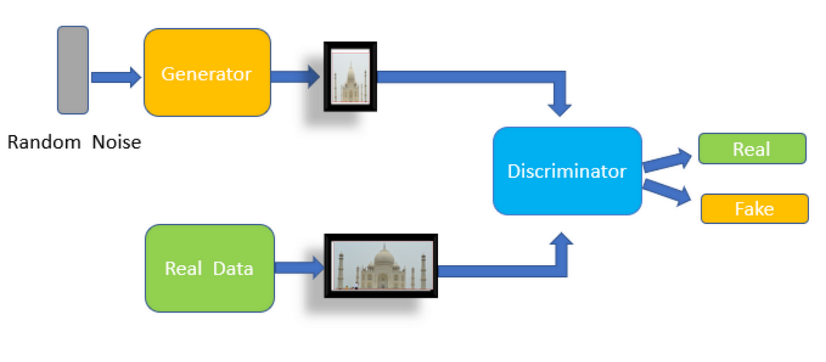

**Architectural Guidelines for Stable Deep Convolutional GANs :**
- Employ an all-convolutional network approach:
    - This strategy is employed in our generator, enabling it to autonomously learn spatial upsampling and in the ac_discriminator.
- Substitute pooling layers with strided convolutions (for the discriminator) and fractional-strided convolutions (for the generator).
- Implement batch normalization in both the generator and discriminator networks.
    - However, we should take note that directly applying batch normalization to all layers can lead to issues such as sample oscillation and model instability.
- Eliminate fully connected hidden layers when dealing with deeper architectures.
- Utilize ReLU activation functions in the generator for all layers, except for the output layer, which should employ Tanh activation.
- Incorporate LeakyReLU activation functions in the ac_ac_discriminator for all layers.

*Radford, A., Metz, L., & Chintala, S. (2015). Unsupervised Representation Learning with Deep Convolutional Generative Adversarial Networks. [arXiv:1511.06434](https://arxiv.org/abs/1511.06434).*

**BUILDING THE DCGAN GENERATOR FUNCTION**

In [19]:
def create_generator(latent_dim):
    
    # Define the Sequential Model
    model = Sequential(name='DCGAN_Generator')
    
    # Foundation for 4x4 image
    n_nodes = 256 * 4 * 4
    model.add(Dense(n_nodes, input_dim=latent_dim))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Reshape((4, 4, 256)))
    
    # Upsample to 8x8
    model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    
    # Upsample to 16x16
    model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    
    # Upsample to 32x32
    model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    
    # Output layer
    model.add(Conv2D(3, (3, 3), activation='tanh', padding='same'))
    return model

In [20]:
create_generator(latent_dim=100).summary()

Model: "DCGAN_Generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 4096)              413696    
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 4096)              0         
                                                                 
 reshape (Reshape)           (None, 4, 4, 256)         0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 8, 8, 128)        524416    
 nspose)                                                         
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 8, 8, 128)         0         
                                                                 
 conv2d_transpose_1 (Conv2DT  (None, 16, 16, 128)      262272    
 ranspose)                                         

**BUILDING THE DCGAN DISCRIMINATOR**

<img align="left" height="200" style="margin-right: 20px" src="https://miro.medium.com/v2/resize:fit:790/1*1VJDP6qDY9-ExTuQVEOlVg.gif">

DCGAN typically uses strided convolutions, instead of pooling layers, to increase the spatial resolution of the generated images. In the discriminator network, it uses a deep convolutional architecture to learn a rich and diverse set of features that can distinguish real images from fake images.

The discriminator takes an image as input, and tries to classify it as "real" or "generated". In this sense, it's like any other binary image classification neural network. We'll use a convolutional neural network (CNN) which outputs a single number for each image. We'll use a stride of 2 to progressively reduce the size of the output feature map, until we have only 1 output.

<img align="right" height="200" style="margin: 10px" src="https://miro.medium.com/v2/resize:fit:1400/1*ypsvQH7kvtI2BhzR2eT_Sw.png">

We are using `Leaky ReLU` for the discriminator. This is different from a regular ReLU function as it allows negative value to be passed as a small gradient signal to the next layer. This prevents a 'dying state' by allowing some negative values to pass through. The whole idea behind making the Generator work is to receive gradient values from the Discriminator, and if the network is stuck in a dying state situation, the learning process won’t happen. [From this article][link]

[link]: https://medium.datadriveninvestor.com/deep-convolutional-generative-adversarial-networks-dcgans-3176238b5a3d

In [21]:
def create_discriminator(in_shape=(32, 32, 3)):
    
    # Define the Sequential Model
    model = Sequential(name='DCGAN_Discriminator')
    
    # Normal
    model.add(Conv2D(64, (3, 3), padding='same', input_shape=in_shape))
    model.add(LeakyReLU(alpha=0.2))
    
    # Downsample
    model.add(Conv2D(128, (3, 3), strides=(2, 2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    
    # Downsample
    model.add(Conv2D(128, (3, 3), strides=(2, 2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    
    # Downsample
    model.add(Conv2D(256, (3, 3), strides=(2, 2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    
    # Classifier
    model.add(Flatten())
    model.add(Dropout(0.4))
    model.add(Dense(1, activation='sigmoid'))
    
    # Compile model
    opt = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
    return model

In [22]:
create_discriminator().summary()

Model: "DCGAN_Discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_1 (Conv2D)           (None, 32, 32, 64)        1792      
                                                                 
 leaky_re_lu_4 (LeakyReLU)   (None, 32, 32, 64)        0         
                                                                 
 conv2d_2 (Conv2D)           (None, 16, 16, 128)       73856     
                                                                 
 leaky_re_lu_5 (LeakyReLU)   (None, 16, 16, 128)       0         
                                                                 
 conv2d_3 (Conv2D)           (None, 8, 8, 128)         147584    
                                                                 
 leaky_re_lu_6 (LeakyReLU)   (None, 8, 8, 128)         0         
                                                                 
 conv2d_4 (Conv2D)           (None, 4, 4, 256) 

**BUILDING THE TRAINING FUNCTIONS AND CLASSES FOR DCGAN**

In [23]:
class DCGAN(Model):
    def __init__(self, generator, discriminator, latent_dim):
        super(DCGAN, self).__init__()
        self.generator = generator
        self.discriminator = discriminator
        self.latent_dim = latent_dim

    def compile(self, d_optimizer, g_optimizer, loss_fn):
        super(DCGAN, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.loss_fn = loss_fn
        self.g_loss_metric = keras.metrics.Mean(name='g_loss')
        self.d_real_loss_metric = keras.metrics.Mean(name='d_real_loss')
        self.d_fake_loss_metric = keras.metrics.Mean(name='d_fake_loss')
        self.d_acc_metric = keras.metrics.BinaryAccuracy(name='d_acc')
        self.kl_metric = keras.metrics.KLDivergence()

    @property
    def metrics(self):
        return [self.g_loss_metric, self.d_real_loss_metric, self.d_fake_loss_metric, self.d_acc_metric]

    def train_step(self, data):
        real_images, _ = data
        batch_size = tf.shape(real_images)[0]

        # Train discriminator
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))
        fake_labels = tf.zeros((batch_size, 1))
        real_labels = tf.ones((batch_size, 1))

        # Freeze generator
        self.discriminator.trainable = True
        self.generator.trainable = False

        with tf.GradientTape() as disc_tape:
            generated_images = self.generator(random_latent_vectors, training=True)
            real_output = self.discriminator(real_images, training=True)
            fake_output = self.discriminator(generated_images, training=True)
            d_loss_real = self.loss_fn(real_labels, real_output)
            d_loss_fake = self.loss_fn(fake_labels, fake_output)
            d_loss = d_loss_real + d_loss_fake

        disc_grads = disc_tape.gradient(d_loss, self.discriminator.trainable_variables)
        self.d_optimizer.apply_gradients(zip(disc_grads, self.discriminator.trainable_variables))

        # Train generator twice
        for _ in range(2):
            random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))
            misleading_labels = tf.ones((batch_size, 1))

            # Freeze discriminator
            self.discriminator.trainable = False
            self.generator.trainable = True

            with tf.GradientTape() as gen_tape:
                generated_images = self.generator(random_latent_vectors, training=True)
                pred_on_fake = self.discriminator(generated_images, training=True)
                g_loss = self.loss_fn(misleading_labels, pred_on_fake)
            
            gen_grads = gen_tape.gradient(g_loss, self.generator.trainable_variables)
            self.g_optimizer.apply_gradients(zip(gen_grads, self.generator.trainable_variables))

        # Update metrics
        self.g_loss_metric.update_state(g_loss)
        self.d_real_loss_metric.update_state(d_loss_real)
        self.d_fake_loss_metric.update_state(d_loss_fake)
        self.d_acc_metric.update_state(real_labels, real_output)
        self.kl_metric.update_state(y_true=real_images, y_pred=generated_images)

        return {
            'g_loss': self.g_loss_metric.result(),
            'd_real_loss': self.d_real_loss_metric.result(),
            'd_fake_loss': self.d_fake_loss_metric.result(),
            'd_acc': self.d_acc_metric.result(),
            'kl_divergence': self.kl_metric.result(),
        }

In [24]:
class GANMonitor(Callback):
    def __init__(self, latent_dim):
        self.latent_dim = latent_dim
        self.fid_scores = []
        self.is_scores = []

    def on_epoch_end(self, epoch, logs=None):
        # plot 100 generated images and save weights every 10 epochs
        latent_vectors = tf.random.normal(shape=(100, self.latent_dim))

        generated_images = self.model.generator(latent_vectors, training=False)
        generated_images = (generated_images + 1) / 2

        if not os.path.exists('modelweights/dcgan'):
            os.makedirs('modelweights/dcgan')

        if not os.path.exists('images/dcgan_images'):
            os.makedirs('images/dcgan_images')
            
        if (epoch + 1) % 50 == 0:
            # Calculate FID and IS
            is_avg, is_std = calculate_inception_score(generated_images)
            fid = calculate_fid(generated_images)
            
            # Append metrics to lists
            self.fid_scores.append(fid)
            self.is_scores.append((is_avg, is_std))
            
            print(f'Epoch {epoch + 1}: Average (IS): {is_avg} | Std (IS): {is_std} | FID Score: {fid}')

        if (epoch + 1) % 10 == 0:
            if not os.path.exists(f'modelweights/dcgan/epoch_{epoch + 1}'):
                os.makedirs(f'modelweights/dcgan/epoch_{epoch + 1}')
                self.model.generator.save_weights(f'modelweights/dcgan/epoch_{epoch + 1}/generator_weights_epoch_{epoch + 1}.h5')
                self.model.discriminator.save_weights(f'modelweights/dcgan/epoch_{epoch + 1}/discriminator_weights_epoch_{epoch + 1}.h5')
                print(f'\nSaving Model Weights at Epoch {epoch + 1}.\n')

            fig, axes = plt.subplots(10, 10, figsize=(20, 20))
            axes = axes.flatten()

            for i, ax in enumerate(axes):
                ax.imshow(generated_images[i])
                ax.axis('off')

            plt.tight_layout()
            plt.savefig(f'images/dcgan_images/generated_img_{epoch + 1}.png')
            plt.close()

In [73]:
EPOCHS = 200
LATENT_DIM = 100    
LEARNING_RATE_D = 0.0002
LEARNING_RATE_G = 0.0002
BETA_1 = 0.5
LABEL_SMOOTHING = 0.1

callbacks = [GANMonitor(LATENT_DIM)]

generator = create_generator(LATENT_DIM)
discriminator = create_discriminator()
dcgan = DCGAN(generator, discriminator, latent_dim=LATENT_DIM)
dcgan.compile(
    g_optimizer=Adam(learning_rate=LEARNING_RATE_G, beta_1=BETA_1),
    d_optimizer=Adam(learning_rate=LEARNING_RATE_D, beta_1=BETA_1),
    loss_fn=BinaryCrossentropy(label_smoothing=LABEL_SMOOTHING)
)

In [74]:
history = dcgan.fit(dataset, epochs=EPOCHS, callbacks=callbacks, use_multiprocessing=True)

Epoch 1/200
391/391 [==============================] - 19s 45ms/step - g_loss: 0.7754 - d_real_loss: 0.6342 - d_fake_loss: 0.7219 - d_acc: 0.6260 - kl_divergence: 4.8469
Epoch 2/200
391/391 [==============================] - 18s 45ms/step - g_loss: 0.7565 - d_real_loss: 0.6964 - d_fake_loss: 0.6760 - d_acc: 0.4744 - kl_divergence: 5.2824
Epoch 3/200
391/391 [==============================] - 18s 45ms/step - g_loss: 0.7146 - d_real_loss: 0.6953 - d_fake_loss: 0.6935 - d_acc: 0.4948 - kl_divergence: 5.3343
Epoch 4/200
391/391 [==============================] - 18s 45ms/step - g_loss: 0.7083 - d_real_loss: 0.6980 - d_fake_loss: 0.6885 - d_acc: 0.4523 - kl_divergence: 5.1964
Epoch 5/200
391/391 [==============================] - 17s 44ms/step - g_loss: 0.7082 - d_real_loss: 0.6968 - d_fake_loss: 0.6906 - d_acc: 0.4417 - kl_divergence: 5.1099
Epoch 6/200
391/391 [==============================] - 17s 44ms/step - g_loss: 0.7054 - d_real_loss: 0.6941 - d_fake_loss: 0.6921 - d_acc: 0.4398 - kl

**DISPLAYING BEST FID AND INCEPTION SCORES FOR DCGAN**

- We can see that the FID and Inception Scores are not too good for DCGAN, with a high FID of 216. Hence we will work on improving this in our next few models, such as the cDCGAN model and SNGAN model.

In [76]:
monitor = callbacks[0]

# Extract the best KL Divergence
best_kl_div = min(history.history['kl_divergence'])

# Extract the best FID Score
best_fid = min(monitor.fid_scores) if monitor.fid_scores else None

# Extract the best IS Score (average)
best_is_avg = max(is_avg for is_avg, _ in monitor.is_scores) if monitor.is_scores else None

# Create a DataFrame to store these best values
dcgan_df = pd.DataFrame({
    'Best KL Divergence': [best_kl_div],
    'Best FID': [best_fid],
    'Best IS': [best_is_avg]
})

# Display the DataFrame
dcgan_df

,Best KL Divergence,Best FID,Best IS
0,4.918345,216.878999,3.357959


**PLOTTING THE MODEL'S PERFORMANCE OVER TIME**

- From the KL Divergence, we see that it starts very high at first and quickly drops, indicating that the generator starts with outputs that are very different from the expected distribution, but rapidly improves.
- For the discriminator accuracy, we see that the accuracy starts around 60%, spikes, then trends upwards. This is not too ideal, as it suggests the discriminator is getting better at distinguishing real from fake, which could mean the generator is not improving at the same rate, or the discriminator is too powerful.
- For the losses, the generator loss starts low and increases upwards, suggesting that the generator is struggling to fool the discriminator as training progresses. In contrast, for the discriminator losses, both lines start high (which is good), drop (which might indicate the generator is getting better), but then they tend to flatten out, suggesting that the discriminator is not being challenged enough by the generator.

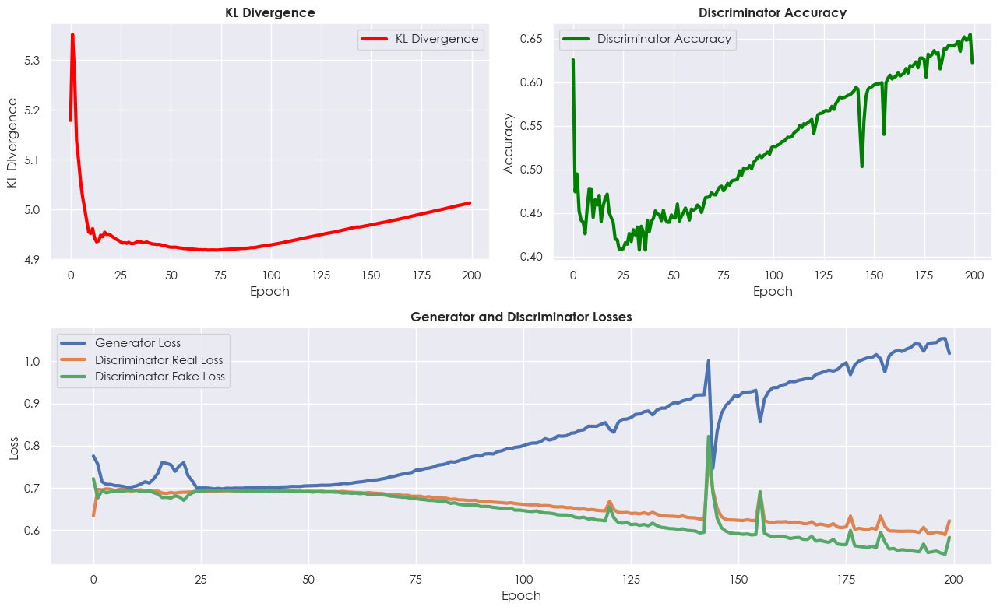

In [77]:
plot_model_performance(history)

**LOADING AND TESTING THE GENERATOR WEIGHTS ON SYNTHETIC IMAGES**

In [78]:
# Loading and testing the generator's weights
generator.load_weights('modelweights/dcgan/epoch_200/generator_weights_epoch_200.h5')
generator.summary()

Model: "DCGAN_Generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_6 (Dense)             (None, 4096)              413696    
                                                                 
 leaky_re_lu_24 (LeakyReLU)  (None, 4096)              0         
                                                                 
 reshape_3 (Reshape)         (None, 4, 4, 256)         0         
                                                                 
 conv2d_transpose_9 (Conv2DT  (None, 8, 8, 128)        524416    
 ranspose)                                                       
                                                                 
 leaky_re_lu_25 (LeakyReLU)  (None, 8, 8, 128)         0         
                                                                 
 conv2d_transpose_10 (Conv2D  (None, 16, 16, 128)      262272    
 Transpose)                                        

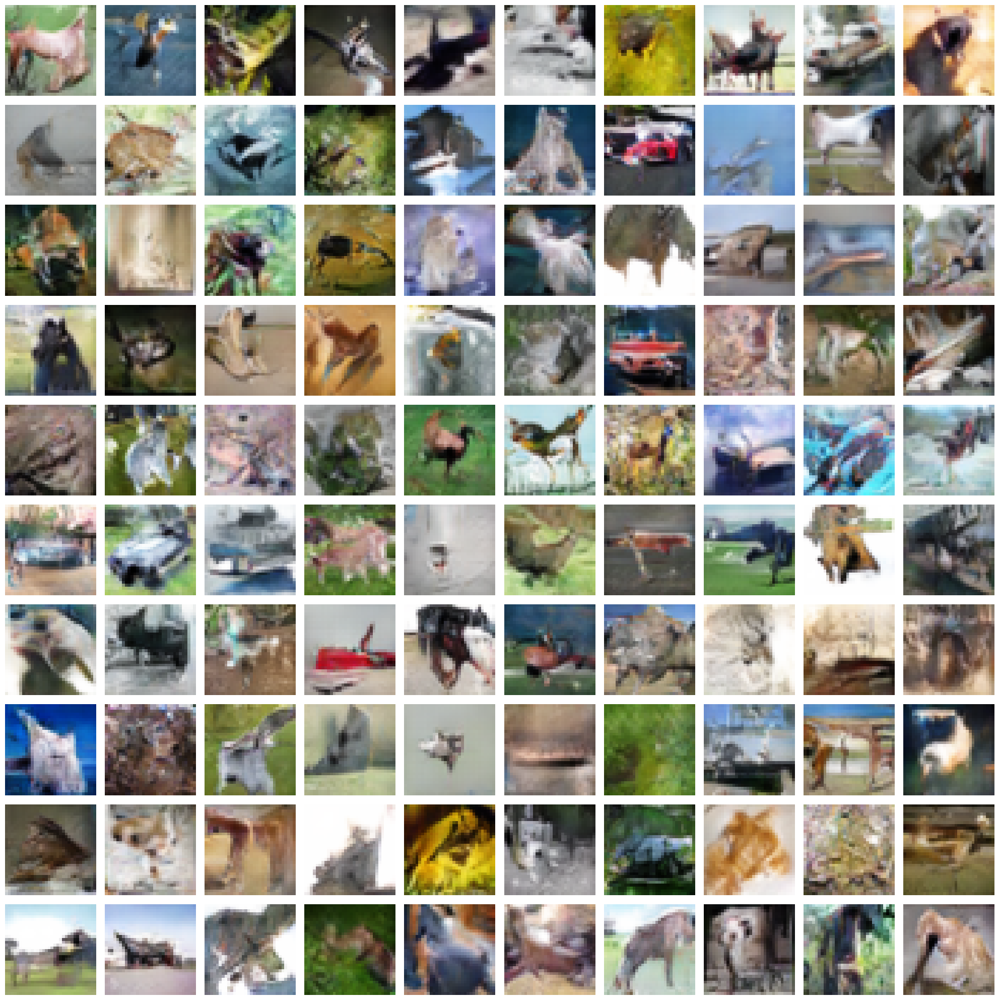

In [79]:
# Generate random latent vectors
latent_vectors = tf.random.normal(shape=(100, LATENT_DIM))

# Generate images using the loaded generator
generated_images = generator(latent_vectors, training=False)
generated_images = (generated_images + 1) / 2

# Create a grid of subplots to display generated images
fig, axes = plt.subplots(10, 10, figsize=(20, 20))
axes = axes.flatten()

for i, ax in enumerate(axes):
    ax.imshow(generated_images[i], cmap='gray')
    ax.axis('off')

plt.tight_layout()
plt.show()

### MODEL 2 : CONDITIONAL DCGAN WITH GRADIENT TAPE

![Conditional DCGAN with Gradient Tape](https://miro.medium.com/v2/resize:fit:901/1*8dMXLw6Z3pCozGHrZxLOrA.png)


Now, we will be exploring Conditional DCGAN, which extends the DCGAN model by incorporating additional information (conditions), such as class labels or data from other modalities, to direct the generation process. This allows the model to generate data that is conditioned on certain attributes, making the model capable of generating more specific or diverse outputs.

In addition, this model also similarly applies **GRADIENT TAPE**, same as DCGAN, which is essentially used for automatic differentiation. Gradient Tape records operations for automatic differentiation; that is, it keeps track of operations performed during forward pass so that during the backward pass (backpropagation), gradients can be computed. By utilizing Gradient Tape with a conditional DCGAN, it provides a more fine-grained control over the training process, as it allows for custom and complex gradient computations. 

**BUILDING THE CDCGAN GENERATOR FUNCTION**

In [47]:
def create_generator(latent_dim):
    # foundation for label embeedded input
    label_input = Input(shape=(1,), name='Label_Input')
    label_embedding = Embedding(10, 10, name='Label_Embedding')(label_input)
    
    # linear activation
    label_embedding = Dense(4 * 4, name='Label_Dense')(label_embedding)

    # reshape to additional channel
    label_embedding = Reshape((4, 4, 1), name='Label_Reshape')(label_embedding)

    # foundation for 4x4 image input
    noise_input = Input(shape=(latent_dim,), name='Noise_Input')
    noise_dense = Dense(4 * 4 * 128, name='Noise_Dense')(noise_input)
    noise_dense = ReLU(name='Noise_ReLU')(noise_dense)
    noise_reshape = Reshape((4, 4, 128), name='Noise_Reshape')(noise_dense)

    # concatenate label embedding and image to produce 129-channel output
    concat = Concatenate(name='Concatenate')([noise_reshape, label_embedding])

    # upsample to 8x8
    conv1 = Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same', name='Conv1')(concat)
    conv1 = ReLU(name='Conv1_ReLU')(conv1)

    # upsample to 16x16
    conv2 = Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same', name='Conv2')(conv1)
    conv2 = ReLU(name='Conv2_ReLU')(conv2)

    # upsample to 32x32
    conv3 = Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same', name='Conv3')(conv2)
    conv3 = ReLU(name='Conv3_ReLU')(conv3)

    # output 32x32x3
    output = Conv2D(3, (3, 3), activation='tanh', padding='same', name='Output')(conv3)
    model = Model(inputs=[noise_input, label_input], outputs=output, name='cDCGAN_Generator')

    return model

In [48]:
create_generator(latent_dim=128).summary()

Model: "cDCGAN_Generator"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Noise_Input (InputLayer)       [(None, 128)]        0           []                               
                                                                                                  
 Label_Input (InputLayer)       [(None, 1)]          0           []                               
                                                                                                  
 Noise_Dense (Dense)            (None, 2048)         264192      ['Noise_Input[0][0]']            
                                                                                                  
 Label_Embedding (Embedding)    (None, 1, 10)        100         ['Label_Input[0][0]']            
                                                                                   

**BUILDING THE cDCGAN DISCRIMINATOR FUNCTION**

In [49]:
def create_discriminator():
    # Foundation for label embedded input
    label_input = Input(shape=(1,), name='Label_Input')
    label_embedding = Embedding(10, 10, name='Label_Embedding')(label_input)
    
    # Linear activation
    label_embedding = Dense(32 * 32, name='Label_Dense')(label_embedding)
    
    # Reshape to additional channel
    label_embedding = Reshape((32, 32, 1), name='Label_Reshape')(label_embedding)

    # Foundation for 32x32 image input
    image_input = Input(shape=(32, 32, 3), name='Image_Input')

    # Concatenate label embedding and image to produce 129-channel input
    concat = Concatenate(name='Concatenate')([image_input, label_embedding])

    # Downsample to 16x16
    conv1 = Conv2D(128, kernel_size=3, strides=2, padding='same', name='Conv1')(concat)
    conv1 = LeakyReLU(alpha=0.2, name='Conv1_Leaky_Relu')(conv1)
    
    # Downsample to 8x8
    conv2 = Conv2D(128, kernel_size=3, strides=2, padding='same', name='Conv2')(conv1)
    conv2 = LeakyReLU(alpha=0.2, name='Conv2_Leaky_Relu')(conv2)
    
    # Downsample to 4x4
    conv3 = Conv2D(128, kernel_size=3, strides=2, padding='same', name='Conv3')(conv2)
    conv3 = LeakyReLU(alpha=0.2, name='Conv3_Leaky_Relu')(conv3)

    # Flatten feature maps
    flat = Flatten(name='Flatten')(conv3)
    output = Dense(units=1, activation='sigmoid', name='Output')(flat)
    model = Model(inputs=[image_input, label_input], outputs=output, name='cDCGAN_Discriminator')

    return model

In [50]:
create_discriminator().summary()

Model: "cDCGAN_Discriminator"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Label_Input (InputLayer)       [(None, 1)]          0           []                               
                                                                                                  
 Label_Embedding (Embedding)    (None, 1, 10)        100         ['Label_Input[0][0]']            
                                                                                                  
 Label_Dense (Dense)            (None, 1, 1024)      11264       ['Label_Embedding[0][0]']        
                                                                                                  
 Image_Input (InputLayer)       [(None, 32, 32, 3)]  0           []                               
                                                                               

**BUILDING THE TRAINING FUNCTIONS AND CLASSES FOR cDCGAN**

In [51]:
class ConditionalDCGAN(Model):
    def __init__(self, generator, discriminator, latent_dim):
        super(ConditionalDCGAN, self).__init__()
        self.generator = generator
        self.discriminator = discriminator
        self.latent_dim = latent_dim

    def compile(self, d_optimizer, g_optimizer, loss_fn):
        super(ConditionalDCGAN, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.loss_fn = loss_fn
        self.g_loss_metric = keras.metrics.Mean(name='g_loss')
        self.d_real_loss_metric = keras.metrics.Mean(name='d_real_loss')
        self.d_fake_loss_metric = keras.metrics.Mean(name='d_fake_loss')
        self.d_acc_metric = keras.metrics.BinaryAccuracy(name='d_acc')
        self.kl_metric = keras.metrics.KLDivergence()

    @property
    def metrics(self):
        return [self.g_loss_metric, self.d_real_loss_metric, self.d_fake_loss_metric, self.d_acc_metric, self.kl_metric]

    def train_step(self, data):
        real_images, class_labels = data
        class_labels = tf.cast(class_labels, 'int32')
        batch_size = tf.shape(real_images)[0]

        # train discriminator
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))

        fake_labels = tf.zeros((batch_size, 1))  # (batch_size, 1)
        real_labels = tf.ones((batch_size, 1))  # (batch_size, 1)

        # freeze generator
        self.discriminator.trainable = True
        self.generator.trainable = False
    
        with tf.GradientTape() as disc_tape:
            disc_tape.watch(self.discriminator.trainable_variables)
            generated_images = self.generator([random_latent_vectors, class_labels], training=True)
            real_output = self.discriminator([real_images, class_labels], training=True)
            fake_output = self.discriminator([generated_images, class_labels], training=True)
            d_loss_real = self.loss_fn(real_labels, real_output)
            d_loss_fake = self.loss_fn(fake_labels, fake_output)
            d_loss = d_loss_real + d_loss_fake  # log(D(x)) + log(1 - D(G(z))
        
        disc_grads = disc_tape.gradient(d_loss, self.discriminator.trainable_variables)
        self.d_optimizer.apply_gradients(zip(disc_grads, self.discriminator.trainable_variables))

        # train the generator
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))
        misleading_labels = tf.ones((batch_size, 1))

        # freeze discriminator
        self.discriminator.trainable = False
        self.generator.trainable = True

        with tf.GradientTape() as gen_tape:
            gen_tape.watch(self.generator.trainable_variables)
            generated_images = self.generator([random_latent_vectors, class_labels], training=True)
            pred_on_fake = self.discriminator([generated_images, class_labels], training=True)
            g_loss = self.loss_fn(misleading_labels, pred_on_fake)  # maximize log(D(G(z))) = minimize -log(1 - D(G(z)))
        
        gen_grads = gen_tape.gradient(g_loss, self.generator.trainable_variables)
        self.g_optimizer.apply_gradients(zip(gen_grads, self.generator.trainable_variables))

        # update metrics
        self.g_loss_metric.update_state(g_loss)
        self.d_real_loss_metric.update_state(d_loss_real)
        self.d_fake_loss_metric.update_state(d_loss_fake)
        self.d_acc_metric.update_state(real_labels, real_output)
        self.kl_metric.update_state(y_true=real_images, y_pred=generated_images)

        return {
            'g_loss': self.g_loss_metric.result(),
            'd_real_loss': self.d_real_loss_metric.result(),
            'd_fake_loss': self.d_fake_loss_metric.result(),
            'd_acc': self.d_acc_metric.result(),
            'kl_divergence': self.kl_metric.result()
        }

In [55]:
class GANMonitor(Callback):
    def __init__(self, latent_dim, class_labels):
        self.latent_dim = latent_dim
        self.class_labels = class_labels
        self.cdcgan_fid_scores = []
        self.cdcgan_is_scores = []

    def on_epoch_end(self, epoch, logs=None):
        # Plot 100 generated images and save weights every 10 epochs
        latent_vectors = tf.random.normal(shape=(100, self.latent_dim))
        class_labels = tf.reshape(tf.range(10), shape=(10, 1))
        class_labels = tf.tile(class_labels, multiples=(1, 10))
        class_labels = tf.reshape(class_labels, shape=(100, 1))

        generated_images = self.model.generator([latent_vectors, class_labels], training=False)
        generated_images = (generated_images + 1) / 2

        if not os.path.exists('modelweights/cdcgan'):
            os.makedirs('modelweights/cdcgan')

        if not os.path.exists('images/cdcgan_images'):
            os.makedirs('images/cdcgan_images')
            
        if (epoch + 1) % 50 == 0:
            # Calculate FID and IS
            is_avg, is_std = calculate_inception_score(generated_images)
            fid = calculate_fid(generated_images)
            
            # Append metrics to lists
            self.cdcgan_fid_scores.append(fid)
            self.cdcgan_is_scores.append((is_avg, is_std))
            
            print(f'Epoch {epoch + 1}: Average (IS): {is_avg} | Std (IS): {is_std} | FID Score: {fid}')

        if (epoch + 1) % 10 == 0:
            if not os.path.exists(f'modelweights/cdcgan/epoch_{epoch + 1}'):
                os.makedirs(f'modelweights/cdcgan/epoch_{epoch + 1}')
                self.model.generator.save_weights(f'modelweights/cdcgan/epoch_{epoch + 1}/generator_weights_epoch_{epoch + 1}.h5')
                self.model.discriminator.save_weights(f'modelweights/cdcgan/epoch_{epoch + 1}/discriminator_weights_epoch_{epoch + 1}.h5')
                print(f'\nSaving Model Weights At Epoch {epoch + 1}.\n')

            fig, axes = plt.subplots(10, 10, figsize=(20, 20))
            axes = axes.flatten()

            for i, ax in enumerate(axes):
                ax.imshow(generated_images[i])
                ax.set_title(self.class_labels[class_labels[i].numpy().item()], fontsize=16)
                ax.axis('off')

            plt.tight_layout()
            plt.savefig(f'images/cdcgan_images/generated_img_{epoch + 1}.png')
            plt.close()

In [56]:
# Defining Constants for the Model
EPOCHS = 200
LATENT_DIM = 128    
LEARNING_RATE = 2e-4
BETA_1 = 0.5
LABEL_SMOOTHING = 0.1

# Defining callbacks for the Model
callbacks = [GANMonitor(LATENT_DIM, class_labels)]

generator = create_generator(LATENT_DIM)
discriminator = create_discriminator()
cdcgan = ConditionalDCGAN(generator, discriminator, latent_dim=LATENT_DIM)
cdcgan.compile(
    g_optimizer=Adam(learning_rate=LEARNING_RATE, beta_1=BETA_1),
    d_optimizer=Adam(learning_rate=LEARNING_RATE, beta_1=BETA_1),
    loss_fn=BinaryCrossentropy(label_smoothing=LABEL_SMOOTHING)
)

In [57]:
history = cdcgan.fit(dataset, epochs=EPOCHS, callbacks=callbacks, use_multiprocessing=True)

Epoch 1/200
391/391 [==============================] - 13s 27ms/step - g_loss: 1.6162 - d_real_loss: 0.4874 - d_fake_loss: 0.4964 - d_acc: 0.8237 - kl_divergence: 5.4479
Epoch 2/200
391/391 [==============================] - 11s 27ms/step - g_loss: 1.6262 - d_real_loss: 0.5470 - d_fake_loss: 0.4331 - d_acc: 0.7348 - kl_divergence: 5.4537
Epoch 3/200
391/391 [==============================] - 10s 26ms/step - g_loss: 1.4885 - d_real_loss: 0.5519 - d_fake_loss: 0.4611 - d_acc: 0.7304 - kl_divergence: 4.6261
Epoch 4/200
391/391 [==============================] - 10s 26ms/step - g_loss: 1.0319 - d_real_loss: 0.6570 - d_fake_loss: 0.5811 - d_acc: 0.5942 - kl_divergence: 5.0323
Epoch 5/200
391/391 [==============================] - 10s 26ms/step - g_loss: 1.0759 - d_real_loss: 0.6324 - d_fake_loss: 0.5847 - d_acc: 0.6427 - kl_divergence: 5.0721
Epoch 6/200
391/391 [==============================] - 10s 26ms/step - g_loss: 1.0250 - d_real_loss: 0.6538 - d_fake_loss: 0.6073 - d_acc: 0.6177 - kl

**DISPLAYING BEST FID AND INCEPTION SCORES FOR cDCGAN**

- Looking at our FID score, we can see that the best FID score for cDCGAN is actually better than the best score for DCGAN, indicating that this model managed to generate better images overall.
- In addition, the KL Divergence for cDCGAN is lower, indicating that the generated data distribution for cDCGAN is closer to the real data distribution.

In [65]:
monitor = callbacks[0]

# Extract the best KL Divergence
best_kl_div = min(history.history['kl_divergence'])

# Extract the best FID Score
best_fid = min(monitor.cdcgan_fid_scores) if monitor.cdcgan_fid_scores else None

# Extract the best IS Score (average)
best_is_avg = max(is_avg for is_avg, _ in monitor.cdcgan_is_scores) if monitor.cdcgan_is_scores else None

# Create a DataFrame to store these best values
cdcgan_df = pd.DataFrame({
    'Best KL Divergence': [best_kl_div],
    'Best FID': [best_fid],
    'Best IS': [best_is_avg]
})

# Display the DataFrame
cdcgan_df

,Best KL Divergence,Best FID,Best IS
0,4.565869,209.350541,2.713431


**PLOTTING THE MODEL'S PERFORMANCE OVER TIME**

- From the KL Divergence, we see that it starts off very high and experiences a sharp drop afterwards, followed by a steady and gradual decline. We see some fluctuations, but the overall trend is downwards, suggesting that the generator is improving in capturing the target data distribution. The relatively smooth decline as opposed to the abrupt changes in the initial epochs indicates that the model is stabilizing over time.
- For the discriminator accuracy, we see that theres a significant spike initially, indicating that the discriminator rapidly improved at the beginning. Following the spike, there's a sharp decline in accuracy, which could suggest that the generator started producing more convincing images, making the discriminator's task more challenging. After the initial fluctuations, the accuracy gradually increases, which implies that the discriminator is becoming better at distinguishing between real and fake images as training progresses. 
- For the losses, the generator loss starts very high, indicating that the generated images were easily distinguished from the real ones. The loss quickly decreases and fluctuates but still trends upwards, indicating that the generator is having a harder time fooling the discriminator as it trains. Meanwhile, the discriminator losses decrease sharply and then level out. The leveling out of the discriminator loss for real images is expected, but the flattening of the loss for fake images suggests that the discriminator is not improving significantly in distinguishing fake images over time.

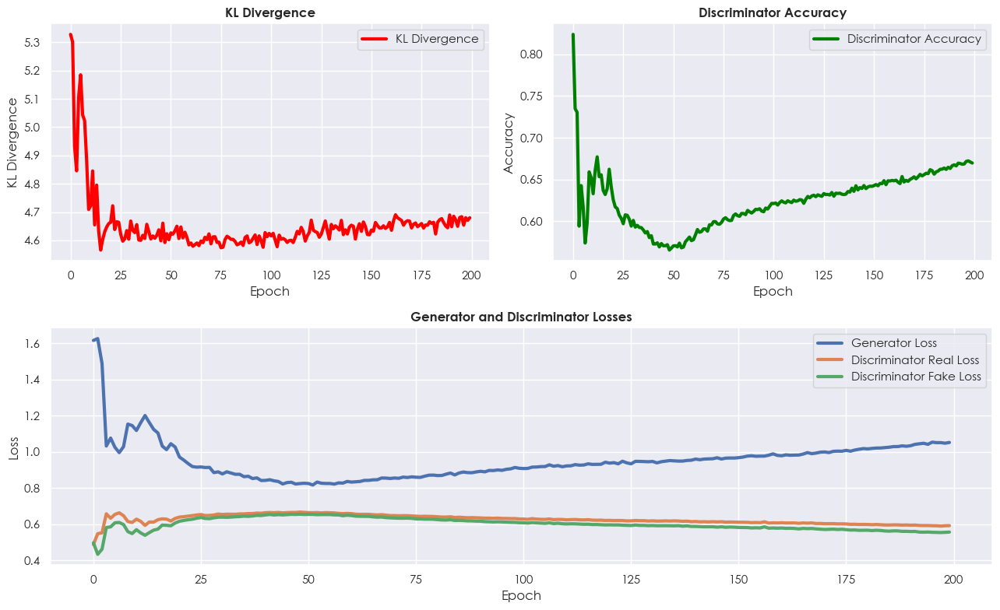

In [60]:
plot_model_performance(history)

**LOADING AND TESTING THE GENERATOR WEIGHTS ON SYNTHETIC IMAGES**

In [61]:
# Loading and testing the generator's weights
generator.load_weights('modelweights/cdcgan/epoch_200/generator_weights_epoch_200.h5')
generator.summary()

Model: "cDCGAN_Generator"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Noise_Input (InputLayer)       [(None, 128)]        0           []                               
                                                                                                  
 Label_Input (InputLayer)       [(None, 1)]          0           []                               
                                                                                                  
 Noise_Dense (Dense)            (None, 2048)         264192      ['Noise_Input[0][0]']            
                                                                                                  
 Label_Embedding (Embedding)    (None, 1, 10)        100         ['Label_Input[0][0]']            
                                                                                   

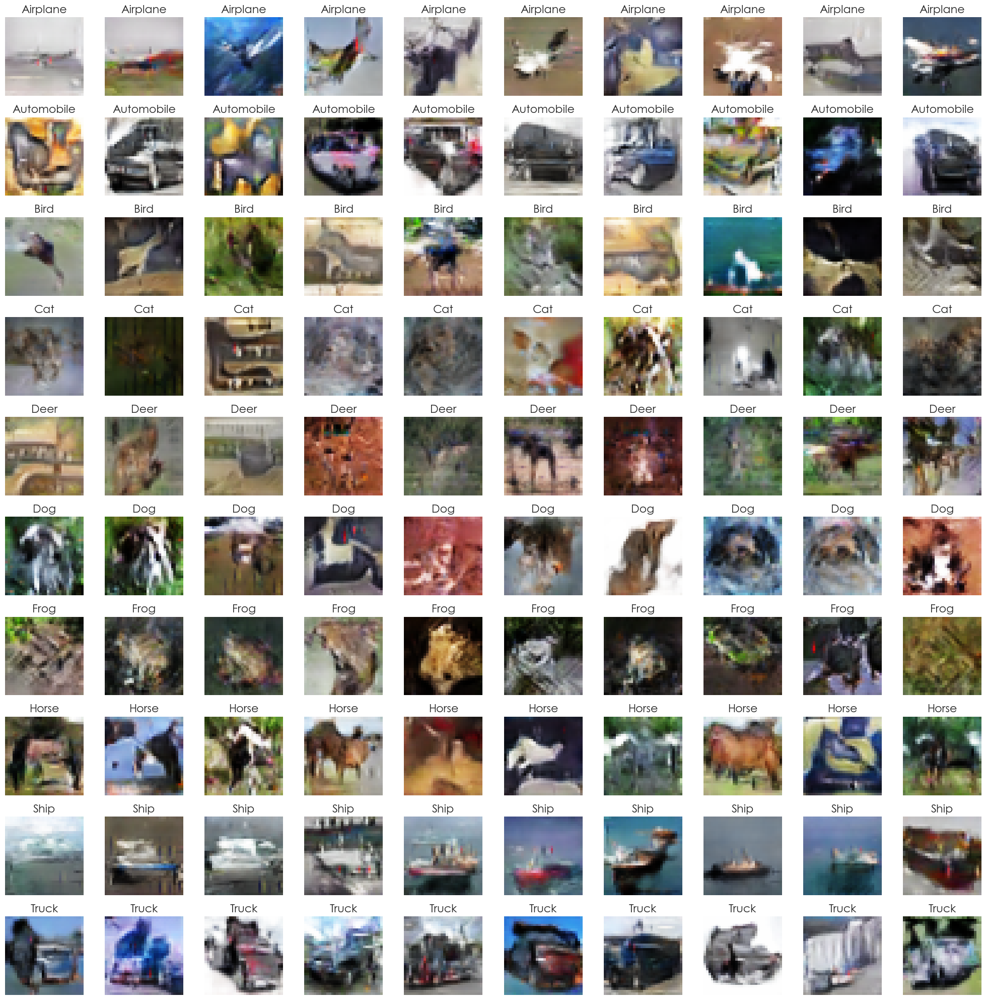

In [62]:
# Generate random latent vectors and class labels
latent_vectors = tf.random.normal(shape=(100, LATENT_DIM))
class_labels = tf.reshape(tf.range(10), shape=(10, 1))
class_labels = tf.tile(class_labels, multiples=(1, 10))
class_labels = tf.reshape(class_labels, shape=(100, 1))

# Generate images using the loaded generator
generated_images = generator([latent_vectors, class_labels], training=False)
generated_images = (generated_images + 1) / 2

# Create a dictionary to map class labels to their corresponding names
label_map = {
    0: 'Airplane',
    1: 'Automobile',
    2: 'Bird',
    3: 'Cat',
    4: 'Deer',
    5: 'Dog',
    6: 'Frog',
    7: 'Horse',
    8: 'Ship',
    9: 'Truck'
}

# Create a grid of subplots and display generated images with labels
fig, axes = plt.subplots(10, 10, figsize=(20, 20))
axes = axes.flatten()

for i, ax in enumerate(axes):
    ax.imshow(generated_images[i], cmap='gray')
    ax.set_title(label_map[class_labels[i].numpy().item()], fontsize=16)
    ax.axis('off')

plt.tight_layout()
plt.show()

### MODEL 3 : SPECTRAL NORMALIZATION GAN - SNGAN

After testing our cDCGAN model, we now experiment with spectral normalization, which is a good way to further help stabilize GAN training. In this case, spectral normalization is applied to the discriminator network, which helps **normalize the weights of the network such that it is Lipschitz continuous.** This means that for a given function, the magnitude of its gradient should be at most K for every point (Cosgrove, 2018).

The effect of the discriminator being Lipschitz continuous is that it put a constraint on the gradients by enforcing an upper bound. And as a result, reduces the risk of exploding gradients. In addition, spectral normalization controls the variance of the weights in the discriminator preventing vanishing gradients (Lin et al., 2021).

 By incorporating spectral normalization, SNGAN overcomes some of the training challenges associated with GANs, such as mode collapse (where the generator produces limited diversity) and vanishing gradients (which hinder convergence). This results in more stable training dynamics and higher-quality generated images.
 
**BUILDING THE SNGAN GENERATOR FUNCTION**

In [25]:
def create_generator(latent_dim):
    # foundation for label embedded input
    label_input = Input(shape=(1,), name='Label_Input')
    label_embedding = Embedding(10, 10, name='Label_Embedding')(label_input)
    
    # linear activation
    label_embedding = Dense(4 * 4, name='Label_Dense')(label_embedding)

    # reshape to additional channel
    label_embedding = Reshape((4, 4, 1), name='Label_Reshape')(label_embedding)

    # foundation for 4x4 image input
    noise_input = Input(shape=(latent_dim,), name='Noise_Input')
    noise_dense = Dense(4 * 4 * 128, name='Noise_Dense')(noise_input)
    noise_dense = ReLU(name='Noise_ReLU')(noise_dense)
    noise_reshape = Reshape((4, 4, 128), name='Noise_Reshape')(noise_dense)

    # concatenate label embedding and image to produce 129-channel output
    concat = keras.layers.Concatenate(name='Concatenate')([noise_reshape, label_embedding])

    # upsample to 8x8
    conv1 = Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same', name='Conv1')(concat)
    conv1 = ReLU(name='Conv1_ReLU')(conv1)

    # upsample to 16x16
    conv2 = Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same', name='Conv2')(conv1)
    conv2 = ReLU(name='Conv2_ReLU')(conv2)

    # upsample to 32x32
    conv3 = Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same', name='Conv3')(conv2)
    conv3 = ReLU(name='Conv3_ReLU')(conv3)

    # output 32x32x3
    output = Conv2D(3, (3, 3), activation='tanh', padding='same', name='Output')(conv3)

    model = Model(inputs=[noise_input, label_input], outputs=output, name='SNGAN_Generator')

    return model

In [26]:
create_generator(latent_dim=128).summary()

Model: "SNGAN_Generator"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Noise_Input (InputLayer)       [(None, 128)]        0           []                               
                                                                                                  
 Label_Input (InputLayer)       [(None, 1)]          0           []                               
                                                                                                  
 Noise_Dense (Dense)            (None, 2048)         264192      ['Noise_Input[0][0]']            
                                                                                                  
 Label_Embedding (Embedding)    (None, 1, 10)        100         ['Label_Input[0][0]']            
                                                                                    

**BUILDING THE SNGAN DISCRIMINATOR FUNCTION**

In [27]:
def create_discriminator():
    # foundation for label embedded input
    label_input = Input(shape=(1,), name='Label_Input')
    label_embedding = Embedding(10, 10, name='Label_Embedding')(label_input)
    
    # linear activation
    label_embedding = Dense(32 * 32, name='Label_Dense')(label_embedding)
    
    # reshape to additional channel
    label_embedding = Reshape((32, 32, 1), name='Label_Reshape')(label_embedding)

    # foundation for 32x32 image input
    image_input = Input(shape=(32, 32, 3), name='Image_Input')

    # concatenate label embedding and image to produce 129-channel input
    concat = keras.layers.Concatenate(name='Concatenate')([image_input, label_embedding])

    # downsample to 16x16
    conv1 = SpectralNormalization(Conv2D(128, kernel_size=3, strides=2, padding='same', name='Conv1'))
    conv1 = conv1(concat)
    conv1 = LeakyReLU(alpha=0.2, name='Conv1_Leaky_ReLU')(conv1)
    
    # downsample to 8x8
    conv2 = SpectralNormalization(Conv2D(128, kernel_size=3, strides=2, padding='same', name='Conv2'))
    conv2 = conv2(conv1)
    conv2 = LeakyReLU(alpha=0.2, name='Conv2_Leaky_ReLU')(conv2)
    
    # downsample to 4x4
    conv3 = SpectralNormalization(Conv2D(128, kernel_size=3, strides=2, padding='same', name='Conv3'))
    conv3 = conv3(conv2)
    conv3 = LeakyReLU(alpha=0.2, name='Conv3_Leaky_ReLU')(conv3)

    # flatten feature maps
    flat = Flatten(name='Flatten')(conv3)
    
    output = Dense(units=1, activation='sigmoid', name='Output')(flat)

    model = Model(inputs=[image_input, label_input], outputs=output, name='SNGAN_Discriminator')

    return model

In [28]:
create_discriminator().summary()

Model: "SNGAN_Discriminator"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Label_Input (InputLayer)       [(None, 1)]          0           []                               
                                                                                                  
 Label_Embedding (Embedding)    (None, 1, 10)        100         ['Label_Input[0][0]']            
                                                                                                  
 Label_Dense (Dense)            (None, 1, 1024)      11264       ['Label_Embedding[0][0]']        
                                                                                                  
 Image_Input (InputLayer)       [(None, 32, 32, 3)]  0           []                               
                                                                                

**BUILDING THE TRAINING FUNCTIONS AND CLASSES FOR SNGAN**

In [29]:
class SNGAN(Model):
    def __init__(self, generator, discriminator, latent_dim):
        super(SNGAN, self).__init__()
        self.generator = generator
        self.discriminator = discriminator
        self.latent_dim = latent_dim

    def compile(self, d_optimizer, g_optimizer, loss_fn):
        super(SNGAN, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.loss_fn = loss_fn
        self.g_loss_metric = keras.metrics.Mean(name='g_loss')
        self.d_real_loss_metric = keras.metrics.Mean(name='d_real_loss')
        self.d_fake_loss_metric = keras.metrics.Mean(name='d_fake_loss')
        self.d_acc_metric = keras.metrics.BinaryAccuracy(name='d_acc')
        self.kl_metric = keras.metrics.KLDivergence()

    @property
    def metrics(self):
        return [self.g_loss_metric, self.d_real_loss_metric, self.d_fake_loss_metric, self.d_acc_metric]

    def train_step(self, data):
        real_images, class_labels = data
        class_labels = tf.cast(class_labels, 'int32')
        batch_size = tf.shape(real_images)[0]

        # train discriminator
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))
        random_class_labels = tf.random.uniform(shape=(batch_size, 1), minval=0, maxval=10, dtype='int32')

        fake_labels = tf.zeros((batch_size, 1))  # (batch_size, 1)
        real_labels = tf.ones((batch_size, 1))  # (batch_size, 1)

        # freeze generator
        self.discriminator.trainable = True
        self.generator.trainable = False
    
        with tf.GradientTape() as disc_tape:
            disc_tape.watch(self.discriminator.trainable_variables)
            generated_images = self.generator([random_latent_vectors, random_class_labels], training=True)
            real_output = self.discriminator([real_images, class_labels], training=True)
            fake_output = self.discriminator([generated_images, random_class_labels], training=True)
            d_loss_real = self.loss_fn(real_labels, real_output)
            d_loss_fake = self.loss_fn(fake_labels, fake_output)
            d_loss = d_loss_real + d_loss_fake  # log(D(x)) + log(1 - D(G(z))
        
        disc_grads = disc_tape.gradient(d_loss, self.discriminator.trainable_variables)
        self.d_optimizer.apply_gradients(zip(disc_grads, self.discriminator.trainable_variables))

        # train the generator
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))
        random_class_labels = tf.random.uniform(shape=(batch_size, 1), minval=0, maxval=10, dtype='int32')
        misleading_labels = tf.ones((batch_size, 1))

        # freeze discriminator
        self.discriminator.trainable = False
        self.generator.trainable = True

        with tf.GradientTape() as gen_tape:
            gen_tape.watch(self.generator.trainable_variables)
            generated_images = self.generator([random_latent_vectors, random_class_labels], training=True)
            pred_on_fake = self.discriminator([generated_images, random_class_labels], training=True)
            # negative log probability of the discriminator making the correct choice
            g_loss = self.loss_fn(misleading_labels, pred_on_fake)  # maximize log(D(G(z))) = minimize -log(1 - D(G(z)))
        
        gen_grads = gen_tape.gradient(g_loss, self.generator.trainable_variables)
        self.g_optimizer.apply_gradients(zip(gen_grads, self.generator.trainable_variables))

        # update metrics
        self.g_loss_metric.update_state(g_loss)
        self.d_real_loss_metric.update_state(d_loss_real)
        self.d_fake_loss_metric.update_state(d_loss_fake)
        self.d_acc_metric.update_state(real_labels, real_output)
        self.kl_metric.update_state(y_true=real_images, y_pred=generated_images)

        return {
            'g_loss': self.g_loss_metric.result(),
            'd_real_loss': self.d_real_loss_metric.result(),
            'd_fake_loss': self.d_fake_loss_metric.result(),
            'd_acc': self.d_acc_metric.result(),
            'kl_divergence': self.kl_metric.result()
        }

In [30]:
class GANMonitor(Callback):
    def __init__(self, latent_dim, class_labels):
        self.latent_dim = latent_dim
        self.class_labels = class_labels
        self.sngan_fid_scores = []
        self.sngan_is_scores = []

    def on_epoch_end(self, epoch, logs=None):
        # plot 100 generated images and save weights every 10 epochs
        latent_vectors = tf.random.normal(shape=(100, self.latent_dim))
        class_labels = tf.reshape(tf.range(10), shape=(10, 1))
        class_labels = tf.tile(class_labels, multiples=(1, 10))
        class_labels = tf.reshape(class_labels, shape=(100, 1))

        generated_images = self.model.generator([latent_vectors, class_labels], training=False)
        generated_images = (generated_images + 1) / 2

        if not os.path.exists('./modelweights/sngan'):
            os.makedirs('./modelweights/sngan')

        if not os.path.exists('./images/sngan_images'):
            os.makedirs('./images/sngan_images')
            
        if (epoch + 1) % 50 == 0:
            # Calculate FID and IS
            is_avg, is_std = calculate_inception_score(generated_images)
            fid = calculate_fid(generated_images)
            
            # Append metrics to lists
            self.sngan_fid_scores.append(fid)
            self.sngan_is_scores.append((is_avg, is_std))
            
            print(f'Epoch {epoch + 1}: Average (IS): {is_avg} | Std (IS): {is_std} | FID Score: {fid}')

        if (epoch + 1) % 10 == 0:
            if not os.path.exists(f'./modelweights/sngan/epoch_{epoch + 1}'):
                os.makedirs(f'./modelweights/sngan/epoch_{epoch + 1}')
                self.model.generator.save_weights(f'./modelweights/sngan/epoch_{epoch + 1}/generator_weights_epoch_{epoch + 1}.h5')
                self.model.discriminator.save_weights(f'./modelweights/sngan/epoch_{epoch + 1}/discriminator_weights_epoch_{epoch + 1}.h5')
                print(f'\nSaving Model Weights at Epoch {epoch + 1}.\n')

            fig, axes = plt.subplots(10, 10, figsize=(20, 20))
            axes = axes.flatten()

            for i, ax in enumerate(axes):
                ax.imshow(generated_images[i])
                ax.set_title(self.class_labels[class_labels[i].numpy().item()], fontsize=16)
                ax.axis('off')

            plt.tight_layout()
            plt.savefig(f'./images/sngan_images/generated_img_{epoch + 1}.png')
            plt.close()

In [31]:
EPOCHS = 200
LATENT_DIM = 128    
LEARNING_RATE = 2e-4
BETA_1 = 0.5
LABEL_SMOOTHING = 0.1

callbacks = [GANMonitor(LATENT_DIM, class_labels)]

generator = create_generator(LATENT_DIM)
discriminator = create_discriminator()
sngan = SNGAN(generator, discriminator, latent_dim=LATENT_DIM)
sngan.compile(
    g_optimizer=Adam(learning_rate=LEARNING_RATE, beta_1=BETA_1),
    d_optimizer=Adam(learning_rate=LEARNING_RATE, beta_1=BETA_1),
    loss_fn=BinaryCrossentropy(label_smoothing=LABEL_SMOOTHING)
)

In [32]:
history = sngan.fit(dataset, epochs=EPOCHS, callbacks=callbacks, use_multiprocessing=True)

Epoch 1/200
391/391 [==============================] - 34s 36ms/step - g_loss: 1.7644 - d_real_loss: 0.4341 - d_fake_loss: 0.4259 - d_acc: 0.8582 - kl_divergence: 5.3875
Epoch 2/200
391/391 [==============================] - 14s 35ms/step - g_loss: 1.6511 - d_real_loss: 0.5495 - d_fake_loss: 0.4368 - d_acc: 0.7396 - kl_divergence: 5.8010
Epoch 3/200
391/391 [==============================] - 13s 34ms/step - g_loss: 1.8632 - d_real_loss: 0.4584 - d_fake_loss: 0.3630 - d_acc: 0.8250 - kl_divergence: 5.9702
Epoch 4/200
391/391 [==============================] - 13s 34ms/step - g_loss: 1.5597 - d_real_loss: 0.5278 - d_fake_loss: 0.4390 - d_acc: 0.7743 - kl_divergence: 5.4570
Epoch 5/200
391/391 [==============================] - 13s 34ms/step - g_loss: 1.2527 - d_real_loss: 0.5611 - d_fake_loss: 0.5217 - d_acc: 0.7383 - kl_divergence: 5.2843
Epoch 6/200
391/391 [==============================] - 13s 34ms/step - g_loss: 1.1731 - d_real_loss: 0.5730 - d_fake_loss: 0.5377 - d_acc: 0.7374 - kl

**DISPLAYING BEST FID AND INCEPTION SCORES FOR SNGAN**

- For SNGAN, we see that although we tried Spectral Normalization, the FID score for SNGAN is not as low as compared to DCGAN and cDCGAN. This shows that the model did not perform as well.
- In addition, the KL Divergence for SNGAN is slightly worse than that of cDCGAN, indicating that the distribution for generated data is further away from the real data distribution.

In [33]:
monitor = callbacks[0]

# Extract the best KL Divergence
best_kl_div = min(history.history['kl_divergence'])

# Extract the best FID Score
best_fid = min(monitor.sngan_fid_scores) if monitor.sngan_fid_scores else None

# Extract the best IS Score (average)
best_is_avg = max(is_avg for is_avg, _ in monitor.sngan_is_scores) if monitor.sngan_is_scores else None

# Create a DataFrame to store these best values
sngan_df = pd.DataFrame({
    'Best KL Divergence': [best_kl_div],
    'Best FID': [best_fid],
    'Best IS': [best_is_avg]
})

# Display the DataFrame
sngan_df

,Best KL Divergence,Best FID,Best IS
0,4.896236,225.471866,2.910617


**PLOTTING THE MODEL'S PERFORMANCE OVER TIME**

- From the KL Divergence, we see that the KL Divergence has a sharp initial decrease, suggesting rapid early improvements in the generator. After the initial drop, the KL Divergence flattens out, which could mean that the generator's distribution has become more stable, potentially resembling the real data distribution.
- For the discriminator accuracy, we see that it starts very high, indicating an initial ability to easily distinguish real from fake. However, it quickly drops, which is a desirable outcome, as it suggests the generator is improving. As the training progresses, the accuracy flattens out at a level that suggests the discriminator is challenged but not entirely outperformed by the generator, which is a positive sign of a balanced adversarial training process.
- For the losses, shows a steep initial drop, indicating rapid learning, and then settles into a relatively stable state with minor fluctuations. This suggests the generator is consistently producing data that challenges the discriminator. In contrast, for the discriminator losses, they are quite low and remain stable throughout training. This stability is good; it suggests the discriminator is performing its task consistently without overpowering the generator.

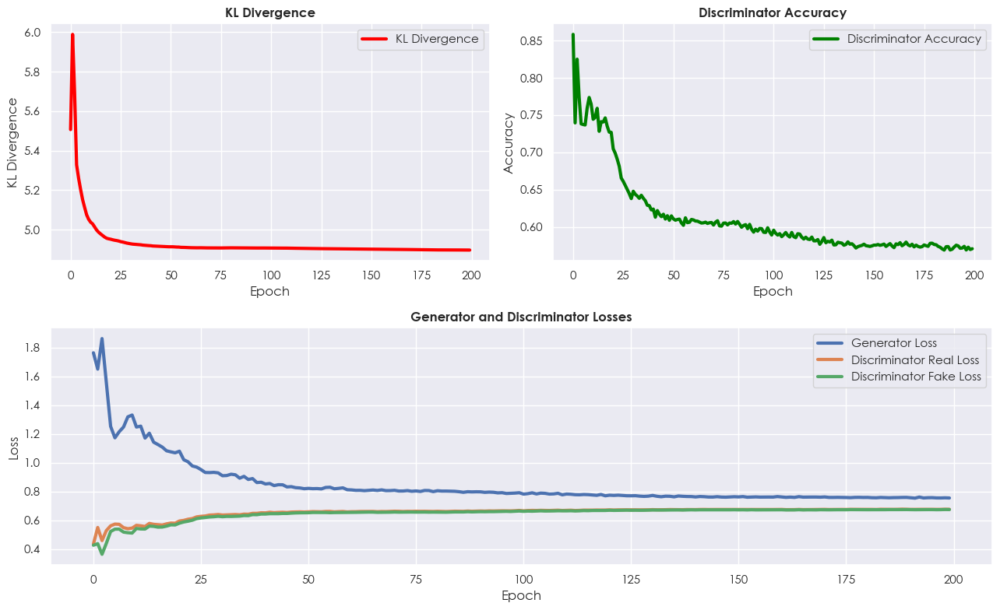

In [34]:
plot_model_performance(history)

**LOADING AND TESTING THE GENERATOR WEIGHTS ON SYNTHETIC IMAGES**

In [35]:
# Loading and testing the generator's weights
generator.load_weights('modelweights/sngan/epoch_200/generator_weights_epoch_200.h5')
generator.summary()

Model: "SNGAN_Generator"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Noise_Input (InputLayer)       [(None, 128)]        0           []                               
                                                                                                  
 Label_Input (InputLayer)       [(None, 1)]          0           []                               
                                                                                                  
 Noise_Dense (Dense)            (None, 2048)         264192      ['Noise_Input[0][0]']            
                                                                                                  
 Label_Embedding (Embedding)    (None, 1, 10)        100         ['Label_Input[0][0]']            
                                                                                    

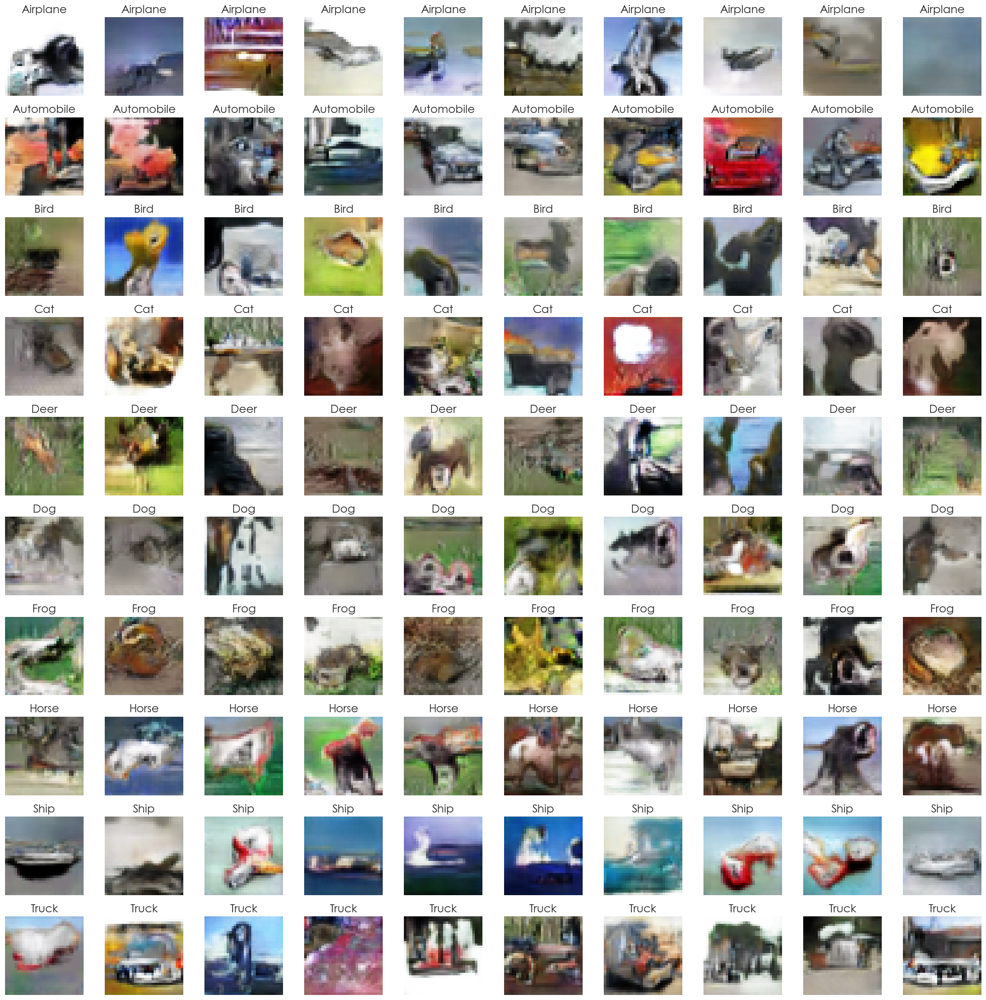

In [36]:
# Generate random latent vectors and class labels
latent_vectors = tf.random.normal(shape=(100, LATENT_DIM))
class_labels = tf.reshape(tf.range(10), shape=(10, 1))
class_labels = tf.tile(class_labels, multiples=(1, 10))
class_labels = tf.reshape(class_labels, shape=(100, 1))

# Generate images using the loaded generator
generated_images = generator([latent_vectors, class_labels], training=False)
generated_images = (generated_images + 1) / 2

# Create a dictionary to map class labels to their corresponding names
label_map = {
    0: 'Airplane',
    1: 'Automobile',
    2: 'Bird',
    3: 'Cat',
    4: 'Deer',
    5: 'Dog',
    6: 'Frog',
    7: 'Horse',
    8: 'Ship',
    9: 'Truck'
}

# Create a grid of subplots and display generated images with labels
fig, axes = plt.subplots(10, 10, figsize=(20, 20))
axes = axes.flatten()

for i, ax in enumerate(axes):
    ax.imshow(generated_images[i], cmap='gray')
    ax.set_title(label_map[class_labels[i].numpy().item()], fontsize=16)
    ax.axis('off')

plt.tight_layout()
plt.show()

### MODEL 4 : ACGAN - AUXILLIARY CLASSIFIER GAN

ACGAN, Auxilliary Classifier Generative Adversarial Network is basically an extension of the traditional GAN framework that incorporates an auxilliary classifier into the generator and discriminator. ACGANs are used for conditional image generation, where the generated images are conditioned on specific class labels. Hence, we are testing this model as a means to improve the control and diversity of generated samples.

![ACGAN](https://machinelearningmastery.com/wp-content/uploads/2019/05/Summary-of-the-Differences-Between-the-Conditional-GAN-Semi-Supervised-GAN-InfoGAN-and-AC-GAN-1024x423.png)

One key feature of ACGAN is its ability to generate images conditioned on specific class labels. When a class label is provided as a condition during generation, the type of image the generator produces can be controlled, allowing the model to generate diverse samples of different classes, making it useful for tasks like image synthesis.

**BUILDING THE ACGAN GENERATOR FUNCTION**

In [76]:
def create_generator(latent_dim):
    # Foundation for label embedded input
    label_input = Input(shape=(1,), name='Label_Input')
    label_embedding = Embedding(10, 10, name='Label_Embedding')(label_input)
    
    # Linear activation
    label_embedding = Dense(4 * 4, name='Label_Dense')(label_embedding)

    # Reshape to additional channel
    label_embedding = Reshape((4, 4, 1), name='Label_Reshape')(label_embedding)

    # Foundation for 4x4 image input
    noise_input = Input(shape=(latent_dim,), name='Noise_Input')
    noise_dense = Dense(4 * 4 * 128, name='Noise_Dense')(noise_input)
    noise_dense = ReLU(name='Noise_ReLU')(noise_dense)
    noise_reshape = Reshape((4, 4, 128), name='Noise_Reshape')(noise_dense)

    # Concatenate label embedding and image to produce 129-channel output
    concat = Concatenate(name='Concatenate')([noise_reshape, label_embedding])

    # Upsample to 8x8
    conv1 = Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same', name='Conv1')(concat)
    conv1 = ReLU(name='Conv1_ReLU')(conv1)

    # Upsample to 16x16
    conv2 = Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same', name='Conv2')(conv1)
    conv2 = ReLU(name='Conv2_ReLU')(conv2)

    # Upsample to 32x32
    conv3 = Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same', name='Conv3')(conv2)
    conv3 = ReLU(name='Conv3_ReLU')(conv3)

    # Output 32x32x3
    output = Conv2D(3, (3, 3), activation='tanh', padding='same', name='Output')(conv3)

    model = Model(inputs=[noise_input, label_input], outputs=output, name='ACGAN_Generator')

    return model

In [77]:
create_generator(latent_dim=128).summary()

Model: "ACGAN_Generator"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Noise_Input (InputLayer)       [(None, 128)]        0           []                               
                                                                                                  
 Label_Input (InputLayer)       [(None, 1)]          0           []                               
                                                                                                  
 Noise_Dense (Dense)            (None, 2048)         264192      ['Noise_Input[0][0]']            
                                                                                                  
 Label_Embedding (Embedding)    (None, 1, 10)        100         ['Label_Input[0][0]']            
                                                                                    

**BUILDING THE ACGAN DISCRIMINATOR FUNCTION**

In [78]:
def create_discriminator():
    input_layer = Input(shape=(32, 32, 3), name='Image_Input')

    # Downsample to 16x16
    conv1 = SpectralNormalization(Conv2D(128, kernel_size=3, strides=2, padding='same', name='Conv1'))
    conv1 = conv1(input_layer)
    conv1 = LeakyReLU(alpha=0.2, name='Conv1_Leaky_ReLU')(conv1)

    # Downsample to 8x8
    conv2 = SpectralNormalization(Conv2D(128, kernel_size=3, strides=2, padding='same', name='Conv2'))
    conv2 = conv2(conv1)
    conv2 = LeakyReLU(alpha=0.2, name='Conv2_Leaky_ReLU')(conv2)

    # Downsample to 4x4
    conv3 = SpectralNormalization(Conv2D(128, kernel_size=3, strides=2, padding='same', name='Conv3'))
    conv3 = conv3(conv2)
    conv3 = LeakyReLU(alpha=0.2, name='Conv3_Leaky_ReLU')(conv3)

    # Flatten feature maps
    flat = Flatten(name='Flatten')(conv3)

    # Output layers
    sigmoid_out = Dense(units=1, activation='sigmoid', name='Sigmoid_Output')(flat)
    softmax_out = Dense(units=10, activation='softmax', name='Softmax_Output')(flat)

    model = Model(input_layer, [sigmoid_out, softmax_out], name='ACGAN_Discriminator')

    return model

In [79]:
create_discriminator().summary()

Model: "ACGAN_Discriminator"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Image_Input (InputLayer)       [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 spectral_normalization_39 (Spe  (None, 16, 16, 128)  3712       ['Image_Input[0][0]']            
 ctralNormalization)                                                                              
                                                                                                  
 Conv1_Leaky_ReLU (LeakyReLU)   (None, 16, 16, 128)  0           ['spectral_normalization_39[0][0]
                                                                 ']                               
                                                                                

**BUILDING THE TRAINING FUNCTIONS AND CLASSES FOR ACGAN**

In [80]:
class ACGAN(Model):
    def __init__(self, generator, discriminator, latent_dim):
        super(ACGAN, self).__init__()
        self.generator = generator
        self.discriminator = discriminator
        self.latent_dim = latent_dim

    def compile(self, d_optimizer, g_optimizer, loss_1, loss_2):
        super(ACGAN, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.loss_1 = loss_1 # disc and gen loss
        self.loss_2 = loss_2 # auxiliary loss
        self.g_loss_metric = keras.metrics.Mean(name='g_loss')
        self.d_loss_metric = keras.metrics.Mean(name='d_loss')  # disc bce loss
        self.aux_loss_metric = keras.metrics.Mean(name='aux_loss')  # disc cce loss
        self.d_acc_metric = keras.metrics.BinaryAccuracy(name='d_acc')
        self.kl_metric = keras.metrics.KLDivergence()

    @property
    def metrics(self):
        return [self.g_loss_metric, self.d_loss_metric, self.aux_loss_metric, self.d_acc_metric]

    def train_step(self, data):
        real_images, class_labels = data
        class_labels = tf.cast(class_labels, tf.float32)
        batch_size = tf.shape(real_images)[0]

        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))
        generated_images = self.generator([random_latent_vectors, class_labels], training=True)

        # freeze generator
        self.discriminator.trainable = True
        self.generator.trainable = False

        with tf.GradientTape() as disc_tape:
            real_pred, real_aux = self.discriminator(real_images, training=True)
            fake_pred, fake_aux = self.discriminator(generated_images, training=True)

            # discriminator loss
            d_loss_1 = self.loss_1(tf.ones_like(real_pred), real_pred)
            d_loss_2 = self.loss_1(tf.zeros_like(fake_pred), fake_pred)
            d_loss = d_loss_1 + d_loss_2
            # auxiliary loss
            aux_loss = self.loss_2(class_labels, fake_aux)
            # total discriminator loss
            d_loss += aux_loss

        # discriminator gradients
        d_grads = disc_tape.gradient(d_loss, self.discriminator.trainable_weights)
        # update discriminator
        self.d_optimizer.apply_gradients(zip(d_grads, self.discriminator.trainable_weights))

        # generator loss
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))

        # freeze discriminator
        self.discriminator.trainable = False
        self.generator.trainable = True

        with tf.GradientTape() as gen_tape:
            generated_images = self.generator([random_latent_vectors, class_labels], training=True)
            fake_pred, fake_aux = self.discriminator(generated_images, training=True)
            g_loss_1 = self.loss_1(tf.ones_like(fake_pred), fake_pred)
            g_loss_2 = self.loss_2(class_labels, fake_aux)
            g_loss = g_loss_1 + g_loss_2

        # generator gradients
        g_grads = gen_tape.gradient(g_loss, self.generator.trainable_weights)
        # update generator
        self.g_optimizer.apply_gradients(zip(g_grads, self.generator.trainable_weights))

        # update metrics
        self.g_loss_metric.update_state(g_loss)
        self.d_loss_metric.update_state(d_loss)
        self.aux_loss_metric.update_state(aux_loss)
        self.d_acc_metric.update_state(tf.ones_like(real_pred), real_pred)
        
        return {
            'g_loss': self.g_loss_metric.result(),
            'd_loss': self.d_loss_metric.result(),
            'aux_loss': self.aux_loss_metric.result(),
            'd_acc': self.d_acc_metric.result(),
            'kl_divergence': self.kl_metric.result()
        }

In [81]:
class GANMonitor(Callback):
    def __init__(self, latent_dim, label_map):
        self.latent_dim = latent_dim
        self.label_map = label_map
        self.acgan_fid_scores = []
        self.acgan_is_scores = []

    def on_epoch_end(self, epoch, logs=None):
        latent_vectors = tf.random.normal(shape=(100, self.latent_dim))
        class_labels = tf.reshape(tf.range(10), shape=(10, 1))
        class_labels = tf.tile(class_labels, multiples=(1, 10))
        class_labels = tf.reshape(class_labels, shape=(100, 1))

        generated_images = self.model.generator([latent_vectors, class_labels], training=False)
        generated_images = (generated_images + 1) / 2
        
        if not os.path.exists('modelweights/acgan'):
            os.makedirs('modelweights/acgan')

        if not os.path.exists('images/acgan_images'):
            os.makedirs('images/acgan_images')
            
        if (epoch + 1) % 50 == 0:
            # Calculate FID and IS
            is_avg, is_std = calculate_inception_score(generated_images)
            fid = calculate_fid(generated_images)
            
            # Append metrics to lists
            self.acgan_fid_scores.append(fid)
            self.acgan_is_scores.append((is_avg, is_std))
            
            print(f'Epoch {epoch + 1}: Average (IS): {is_avg} | Std (IS): {is_std} | FID Score: {fid}')
            
        if (epoch + 1) % 10 == 0:
            if not os.path.exists(f'./modelweights/acgan/epoch_{epoch + 1}'):
                os.makedirs(f'./modelweights/acgan/epoch_{epoch + 1}')
                self.model.generator.save_weights(f'./modelweights/acgan/epoch_{epoch + 1}/generator_weights_epoch_{epoch + 1}.h5')
                self.model.discriminator.save_weights(f'./modelweights/acgan/epoch_{epoch + 1}/discriminator_weights_epoch_{epoch + 1}.h5')
                print(f'\nSaving Model Weights at Epoch {epoch + 1}.\n')

            fig, axes = plt.subplots(10, 10, figsize=(20, 20))
            axes = axes.flatten()

            for i, ax in enumerate(axes):
                ax.imshow(generated_images[i])
                ax.set_title(self.label_map[class_labels[i].numpy().item()], fontsize=16)
                ax.axis('off')

            plt.tight_layout()
            plt.savefig(f'./images/acgan_images/generated_img_{epoch + 1}.png')
            plt.close()

In [82]:
EPOCHS = 200
LATENT_DIM = 128    
LEARNING_RATE = 2e-4
BETA_1 = 0.5
LABEL_SMOOTHING = 0.1

label_map = {
    0: 'Airplane',
    1: 'Automobile',
    2: 'Bird',
    3: 'Cat',
    4: 'Deer',
    5: 'Dog',
    6: 'Frog',
    7: 'Horse',
    8: 'Ship',
    9: 'Truck'
}

callbacks = [GANMonitor(LATENT_DIM, label_map)]

generator = create_generator(LATENT_DIM)
discriminator = create_discriminator()
acgan = ACGAN(generator, discriminator, latent_dim=LATENT_DIM)
acgan.compile(
    g_optimizer=Adam(learning_rate=LEARNING_RATE, beta_1=BETA_1),
    d_optimizer=Adam(learning_rate=LEARNING_RATE, beta_1=BETA_1),
    loss_1=BinaryCrossentropy(label_smoothing=LABEL_SMOOTHING),
    loss_2=SparseCategoricalCrossentropy()
)

In [83]:
history = acgan.fit(dataset, epochs=EPOCHS, callbacks=callbacks, use_multiprocessing=True)

Epoch 1/200
391/391 [==============================] - 15s 33ms/step - g_loss: 4.0498 - d_loss: 3.1857 - aux_loss: 2.3076 - d_acc: 0.8450 - kl_divergence: 0.0000e+00
Epoch 2/200
391/391 [==============================] - 13s 32ms/step - g_loss: 4.3621 - d_loss: 3.0696 - aux_loss: 2.3052 - d_acc: 0.8489 - kl_divergence: 0.0000e+00
Epoch 3/200
391/391 [==============================] - 13s 32ms/step - g_loss: 4.4807 - d_loss: 2.9905 - aux_loss: 2.3054 - d_acc: 0.8857 - kl_divergence: 0.0000e+00
Epoch 4/200
391/391 [==============================] - 13s 32ms/step - g_loss: 4.0874 - d_loss: 3.1909 - aux_loss: 2.3074 - d_acc: 0.8119 - kl_divergence: 0.0000e+00
Epoch 5/200
391/391 [==============================] - 13s 32ms/step - g_loss: 3.8019 - d_loss: 3.2663 - aux_loss: 2.3014 - d_acc: 0.8035 - kl_divergence: 0.0000e+00
Epoch 6/200
391/391 [==============================] - 13s 32ms/step - g_loss: 2.5440 - d_loss: 2.3394 - aux_loss: 1.2589 - d_acc: 0.7666 - kl_divergence: 0.0000e+00
Epoc

**DISPLAYING BEST FID AND INCEPTION SCORES FOR ACGAN**

- Based on the scores for ACGAN, we see that the FID score for ACGAN is slightly better than that of SNGAN, suggesting that there is a slightly smaller difference between the distributions of the generated images and the real images.
- In terms of KL Divergence, we see that it has a score of 0, indicating that the ACGAN may have overfitted, due to an anomaly in the measurement process, or a saturation of the metric where the actual value might be so small that it is effectively zero. This could indicate that the images generated would not be the best when compared to our other models.

In [85]:
monitor = callbacks[0]

# Extract the best KL Divergence
best_kl_div = min(history.history['kl_divergence'])

# Extract the best FID Score
best_fid = min(monitor.acgan_fid_scores) if monitor.acgan_fid_scores else None

# Extract the best IS Score (average)
best_is_avg = max(is_avg for is_avg, _ in monitor.acgan_is_scores) if monitor.acgan_is_scores else None

# Create a DataFrame to store these best values
acgan_df = pd.DataFrame({
    'Best KL Divergence': [best_kl_div],
    'Best FID': [best_fid],
    'Best IS': [best_is_avg]
})

# Display the DataFrame
acgan_df

,Best KL Divergence,Best FID,Best IS
0,0.0,220.342068,2.868265


**PLOTTING THE MODEL'S PERFORMANCE OVER TIME**

- From the KL Divergence, we see that the it is nearly flat with the values hovering around zero. This effectively suggests that there is very little divergence between probability distributions of the real and generated data.
- For the discriminator accuracy, we see that there is a sharp initial decrease from a high value, suggesting the discriminator's ability to distinguish between real and generated images improved rapidly at the start of training. Following this drop, the accuracy gradually levels off to a value just above 0.55, or 55%. This indicates that the discriminator is performing slightly better than random chance (which would be 50%), and the generator is producing images that are somewhat challenging for the discriminator to classify accurately.
- For the losses, the generator loss starts very high, indicating the initial outputs from the generator were easily distinguishable from real data. It drops significantly and quickly stabilizes, which is indicative of the generator learning to produce more convincing data. In contrast, for the discriminator losses, it also starts high and drops quickly, which suggests the discriminator rapidly became better at distinguishing real from fake. However, its loss flattens out as well, which is a sign that it is facing a consistent challenge from the improving generator. 
- Lastly, for the auxiliary loss, it is relatively stable throughout training, suggesting that the auxiliary classifier component of the GAN is performing consistently.

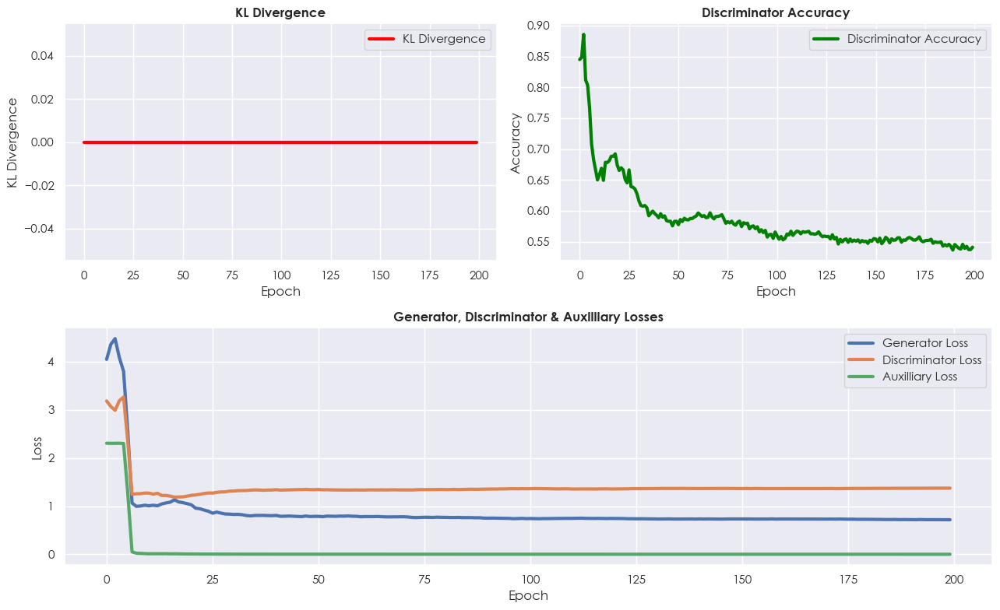

In [88]:
plot_model_performance_acgan(history)

**LOADING AND TESTING THE GENERATOR WEIGHTS ON SYNTHETIC IMAGES**

In [89]:
# Loading and testing the generator's weights
generator.load_weights('modelweights/acgan/epoch_200/generator_weights_epoch_200.h5')
generator.summary()

Model: "ACGAN_Generator"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Noise_Input (InputLayer)       [(None, 128)]        0           []                               
                                                                                                  
 Label_Input (InputLayer)       [(None, 1)]          0           []                               
                                                                                                  
 Noise_Dense (Dense)            (None, 2048)         264192      ['Noise_Input[0][0]']            
                                                                                                  
 Label_Embedding (Embedding)    (None, 1, 10)        100         ['Label_Input[0][0]']            
                                                                                    

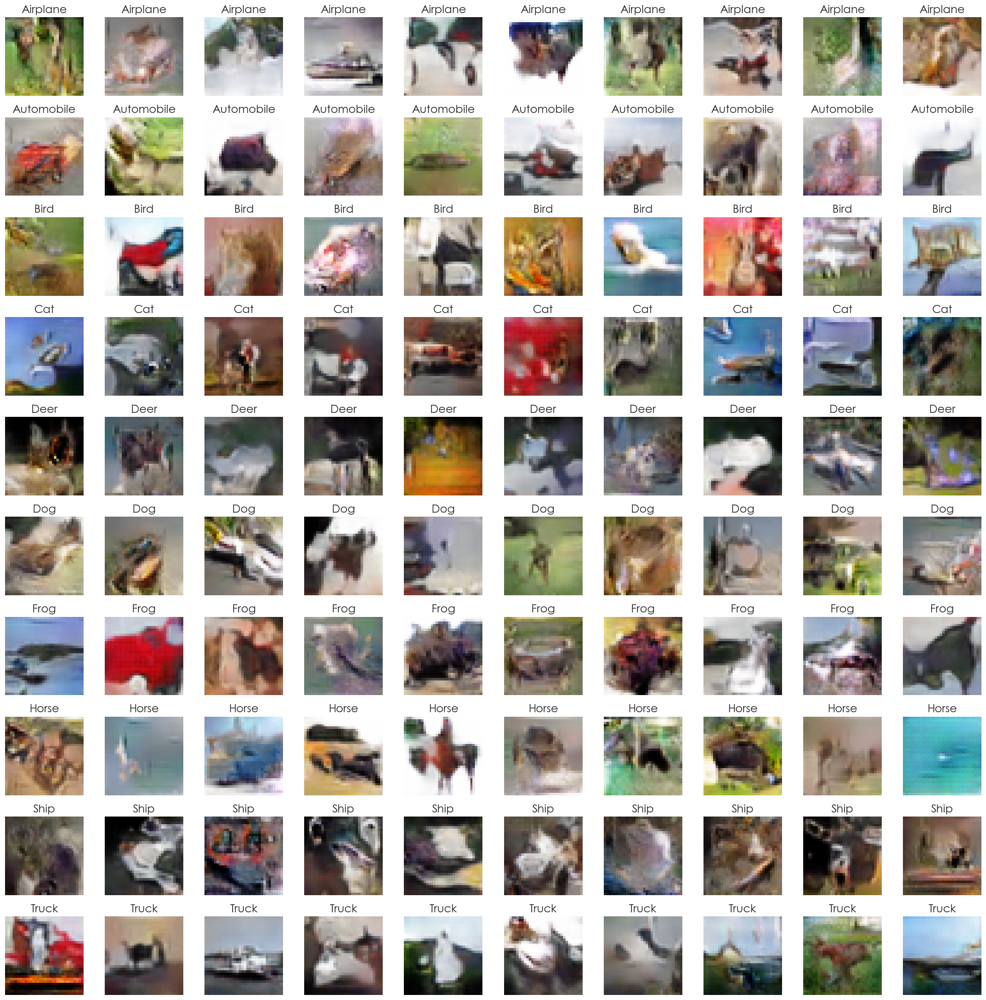

In [90]:
# Generate random latent vectors and class labels
latent_vectors = tf.random.normal(shape=(100, LATENT_DIM))
class_labels = tf.reshape(tf.range(10), shape=(10, 1))
class_labels = tf.tile(class_labels, multiples=(1, 10))
class_labels = tf.reshape(class_labels, shape=(100, 1))

# Generate images using the loaded generator
generated_images = generator([latent_vectors, class_labels], training=False)
generated_images = (generated_images + 1) / 2

# Create a dictionary to map class labels to their corresponding names
label_map = {
    0: 'Airplane',
    1: 'Automobile',
    2: 'Bird',
    3: 'Cat',
    4: 'Deer',
    5: 'Dog',
    6: 'Frog',
    7: 'Horse',
    8: 'Ship',
    9: 'Truck'
}

# Create a grid of subplots and display generated images with labels
fig, axes = plt.subplots(10, 10, figsize=(20, 20))
axes = axes.flatten()

for i, ax in enumerate(axes):
    ax.imshow(generated_images[i], cmap='gray')
    ax.set_title(label_map[class_labels[i].numpy().item()], fontsize=16)
    ax.axis('off')

plt.tight_layout()
plt.show()

### EVALUATION OF INITIAL GAN MODELS

To evaluate our models for us to decide which models to tune, we will be performing 3 different types of analysis on our models thus far. These mainly include :

- Image Fidelity
- Latent Space Evolution

**EVALUATING IMAGE FIDELITY WITH FID, IS AND KL DIVERGENCE**

Here, we will use KL Divergence, Inception Score and Frechet Inception Distance to analyze the metrics. The reason we use these two is because we want to see how our model stacks up to the best models in the world. As other metrics such as iFID and KID are difficult to find on the benchmarks as they are less popular, we avoid them, despite metrics such as KID proving to be a strong and robust metric.

In [100]:
# Add a 'Model' column to each DataFrame
dcgan_df['Model'] = 'DCGAN'
cdcgan_df['Model'] = 'cDCGAN'
sngan_df['Model'] = 'SNGAN'
acgan_df['Model'] = 'ACGAN'

# Concatenate all DataFrames into one, ensuring the model names are included
final_df = pd.concat([dcgan_df, cdcgan_df, sngan_df, acgan_df], ignore_index=True)
final_df = final_df[['Model', 'Best KL Divergence', 'Best FID', 'Best IS']]

# Display the combined DataFrame
final_df

,Model,Best KL Divergence,Best FID,Best IS
0,DCGAN,4.918345,216.878999,3.357959
1,cDCGAN,4.565869,209.350541,2.713431
2,SNGAN,4.896236,225.471866,2.910617
3,ACGAN,0.000000,220.342068,2.868265


**ANALYSIS OF IMAGE FIDELITY**

- From our analysis, a strong candidate for model improvement is cDCGAN as it returned the lowest FID scores, and since our goal is to improve the image quality and similarity to the real data provided, we would likely choose cDCGAN for further improvement.
- In terms of Inception Scores, although slightly lower in comparison to the other models, we will still choose cDCGAN for further experimental improvement as IS only represents image quality, but our focus is on generating images that make sense, hence FID will be a more suitable metric to look at.

**EVALUATING LATENT SPACE EVOLUTION**

For latent space evolution, we will be assessing how the images change over time and how its quality improves over time. To visualize this, we will plot the animations of the image improvements over time, allowing us to see how exactly the images get better (or worse) as training progresses.

We will first define a function that enables us to display the `gifs` for each of the models.

In [142]:
def display_gif(gif):
    return HTML('<img src="{}">'.format(gif))

**DCGAN**

In [144]:
# Check if the directory exists, and create it if it doesn't
directory_path = './animation/dcgan'
if not os.path.exists(directory_path):
    os.makedirs(directory_path)

# Collect image paths
images = [] 
gan_img_paths = glob.glob("./images/dcgan_images/*.png") 

# Load images
for path in gan_img_paths: 
    images.append(imageio.imread(path)) 
    
# Save the GIF in the created directory
imageio.mimsave(os.path.join(directory_path, 'DCGAN.gif'), images, duration=0.2)
filename=os.path.join(directory_path, 'DCGAN.gif')

# Display the GIF
display_gif(filename)

**cDCGAN**

In [20]:
# Check if the directory exists, and create it if it doesn't
directory_path = './animation/cdcgan'
if not os.path.exists(directory_path):
    os.makedirs(directory_path)

# Collect image paths
images = [] 
gan_img_paths = glob.glob("./images/cdcgan_images/*.png") 

# Load images
for path in gan_img_paths: 
    images.append(imageio.imread(path)) 
    
# Save the GIF in the created directory
imageio.mimsave(os.path.join(directory_path, 'cDCGAN.gif'), images, duration=0.2)
filename=os.path.join(directory_path, 'cDCGAN.gif')

# Display the GIF
display_gif(filename)

**SNGAN**

In [21]:
# Check if the directory exists, and create it if it doesn't
directory_path = './animation/sngan'
if not os.path.exists(directory_path):
    os.makedirs(directory_path)

# Collect image paths
images = [] 
gan_img_paths = glob.glob("./images/sngan_images/*.png") 

# Load images
for path in gan_img_paths: 
    images.append(imageio.imread(path)) 
    
# Save the GIF in the created directory
imageio.mimsave(os.path.join(directory_path, 'SNGAN.gif'), images, duration=0.2)
filename=os.path.join(directory_path, 'SNGAN.gif')

# Display the GIF
display_gif(filename)

**ACGAN**

In [22]:
# Check if the directory exists, and create it if it doesn't
directory_path = './animation/acgan'
if not os.path.exists(directory_path):
    os.makedirs(directory_path)

# Collect image paths
images = [] 
gan_img_paths = glob.glob("./images/acgan_images/*.png") 

# Load images
for path in gan_img_paths: 
    images.append(imageio.imread(path)) 
    
# Save the GIF in the created directory
imageio.mimsave(os.path.join(directory_path, 'ACGAN.gif'), images, duration=0.2)
filename=os.path.join(directory_path, 'ACGAN.gif')

# Display the GIF
display_gif(filename)

**ANALYSIS OF IMAGE TRANSFORMATION OVER TIME**

- After viewing the gifs of the images, we can see that although the quality and resolution of ACGAN images improved the most over time, the cCDGAN images ended up with images that best resembled the real images with slow and gradual changes, hence we will be choosing cDCGAN for further improvement and experimental purposes.

### MODEL IMPROVEMENT FOR GAN MODELS

- For model improvement, we will be manually tuning our cDCGAN model, which provided the best FID score across all the models.
- To improve our model, we will be adding BatchNormalization, PReLU, and Gaussian Weight Initialization. We also increased the number of epochs from 200 to 300 to see if training our model for a longer period of time will help in the generation of better images.

**WHY BATCH NORMALIZATION?** - Potentially helps to stabilize training as it normalizes the activations of each layer in a mini-batch during training, helping reduce internal covariate shift, making it easier for the model to converge.

**WHY USE PReLU?** - Adaptively learns the slope of the rectified linear unit (ReLU) during training. Unlike traditional ReLU, which has a fixed slope (0 for negative values), PReLU allows negative values to have a learned slope, making it suitable for handling the vanishing gradient problem.

**WHY USE GAUSSIAN WEIGHT INITIALIZATION?** - He and Xavier weights initialization are unsuitable for training as it makes training more unstable due to the larger distribution of weights. To reduce the instability of training, we will be using Gaussian Weight Initialization[mean = 0, std = 0.02]

**BEST MODEL TO BE USED FOR IMPROVEMENT : cDCGAN MODEL WITH GRADIENT TAPE**

**BUILDING THE TUNED CDCGAN GENERATOR FUNCTION**

In [106]:
def create_generator(latent_dim):
    # Weight initializer
    init = RandomNormal(mean=0.0, stddev=0.02)

    # Label embedding and input
    label_input = Input(shape=(1,), name='Label_Input')
    label_embedding = Embedding(10, 50, embeddings_initializer=init, name='Label_Embedding')(label_input)
    label_embedding = Dense(4*4, kernel_initializer=init, name='Label_Dense')(label_embedding)
    label_embedding = Reshape((4, 4, 1), name='Label_Reshape')(label_embedding)

    # Noise input
    noise_input = Input(shape=(latent_dim,), name='Noise_Input')
    noise_dense = Dense(4*4*128, kernel_initializer=init, name='Noise_Dense')(noise_input)
    noise_dense = LeakyReLU(alpha=0.2, name='Noise_LeakyReLU')(noise_dense)
    noise_reshape = Reshape((4, 4, 128), name='Noise_Reshape')(noise_dense)

    # Combine noise and label
    concat = Concatenate(name='Concatenate')([noise_reshape, label_embedding])

    # Convolutional layers
    conv1 = Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same', kernel_initializer=init, name='Conv1')(concat)
    conv1 = BatchNormalization(name='Conv1_BatchNorm', momentum=0.8)(conv1)
    conv1 = PReLU(name='Conv1_PReLU')(conv1)

    conv2 = Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same', kernel_initializer=init, name='Conv2')(conv1)
    conv2 = BatchNormalization(name='Conv2_BatchNorm', momentum=0.8)(conv2)
    conv2 = PReLU(name='Conv2_PReLU')(conv2)

    conv3 = Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same', kernel_initializer=init, name='Conv3')(conv2)
    conv3 = BatchNormalization(name='Conv3_BatchNorm', momentum=0.8)(conv3)
    conv3 = PReLU(name='Conv3_PReLU')(conv3)

    # Output layer
    output = Conv2D(3, (3, 3), activation='tanh', padding='same', kernel_initializer=init, name='Output')(conv3)
    model = Model(inputs=[noise_input, label_input], outputs=output, name='Improved_cDCGAN_Generator')
    
    return model

In [107]:
create_generator(latent_dim=128).summary()

Model: "Improved_cDCGAN_Generator"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Noise_Input (InputLayer)       [(None, 128)]        0           []                               
                                                                                                  
 Label_Input (InputLayer)       [(None, 1)]          0           []                               
                                                                                                  
 Noise_Dense (Dense)            (None, 2048)         264192      ['Noise_Input[0][0]']            
                                                                                                  
 Label_Embedding (Embedding)    (None, 1, 50)        500         ['Label_Input[0][0]']            
                                                                          

**BUILDING THE TUNED CDCGAN DISCRIMINATOR FUNCTION**

In [108]:
def create_discriminator():
    # Weight initializer
    init = RandomNormal(mean=0.0, stddev=0.02)

    # Label embedding and input
    label_input = Input(shape=(1,), name='Label_Input')
    label_embedding = Embedding(10, 50, embeddings_initializer=init, name='Label_Embedding')(label_input)
    label_embedding = Dense(32*32, kernel_initializer=init, name='Label_Dense')(label_embedding)
    label_embedding = Reshape((32, 32, 1), name='Label_Reshape')(label_embedding)

    # Image input
    image_input = Input(shape=(32, 32, 3), name='Image_Input')

    # Combine image and label
    concat = Concatenate(name='Concatenate')([image_input, label_embedding])

    # Convolutional layers
    conv1 = Conv2D(128, kernel_size=3, strides=2, padding='same', kernel_initializer=init, name='Conv1')(concat)
    conv1 = PReLU(name='Conv1_PReLU')(conv1)

    conv2 = Conv2D(128, kernel_size=3, strides=2, padding='same', kernel_initializer=init, name='Conv2')(conv1)
    conv2 = PReLU(name='Conv2_PReLU')(conv2)

    conv3 = Conv2D(128, kernel_size=3, strides=2, padding='same', kernel_initializer=init, name='Conv3')(conv2)
    conv3 = PReLU(name='Conv3_PReLU')(conv3)

    # Output layer
    flat = Flatten(name='Flatten')(conv3)
    output = Dense(1, activation='sigmoid', kernel_initializer=init, name='Output')(flat)

    # Model definition
    model = Model(inputs=[image_input, label_input], outputs=output, name='Improved_cDCGAN_Discriminator')
    return model

In [109]:
create_discriminator().summary()

Model: "Improved_cDCGAN_Discriminator"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Label_Input (InputLayer)       [(None, 1)]          0           []                               
                                                                                                  
 Label_Embedding (Embedding)    (None, 1, 50)        500         ['Label_Input[0][0]']            
                                                                                                  
 Label_Dense (Dense)            (None, 1, 1024)      52224       ['Label_Embedding[0][0]']        
                                                                                                  
 Image_Input (InputLayer)       [(None, 32, 32, 3)]  0           []                               
                                                                      

**BUILDING THE TRAINING FUNCTIONS AND CLASSES FOR IMPROVED CDCGAN**

In [110]:
class TunedConditionalDCGAN(Model):
    def __init__(self, generator, discriminator, latent_dim):
        super(TunedConditionalDCGAN, self).__init__()
        self.generator = generator
        self.discriminator = discriminator
        self.latent_dim = latent_dim

    def compile(self, d_optimizer, g_optimizer, loss_fn):
        super(TunedConditionalDCGAN, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.loss_fn = loss_fn
        self.g_loss_metric = keras.metrics.Mean(name='g_loss')
        self.d_real_loss_metric = keras.metrics.Mean(name='d_real_loss')
        self.d_fake_loss_metric = keras.metrics.Mean(name='d_fake_loss')
        self.d_acc_metric = keras.metrics.BinaryAccuracy(name='d_acc')
        self.kl_metric = keras.metrics.KLDivergence()

    @property
    def metrics(self):
        return [self.g_loss_metric, self.d_real_loss_metric, self.d_fake_loss_metric, self.d_acc_metric, self.kl_metric]

    def train_step(self, data):
        real_images, class_labels = data
        class_labels = tf.cast(class_labels, 'int32')
        batch_size = tf.shape(real_images)[0]

        # train discriminator
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))

        fake_labels = tf.zeros((batch_size, 1))  # (batch_size, 1)
        # Adjust real_labels for label smoothing applied
        real_labels = tf.ones((batch_size, 1))

        # freeze generator
        self.discriminator.trainable = True
        self.generator.trainable = False
    
        with tf.GradientTape() as disc_tape:
            disc_tape.watch(self.discriminator.trainable_variables)
            generated_images = self.generator([random_latent_vectors, class_labels], training=True)
            real_output = self.discriminator([real_images, class_labels], training=True)
            fake_output = self.discriminator([generated_images, class_labels], training=True)
            d_loss_real = self.loss_fn(real_labels, real_output)
            d_loss_fake = self.loss_fn(fake_labels, fake_output)
            d_loss = d_loss_real + d_loss_fake  # log(D(x)) + log(1 - D(G(z))
        
        disc_grads = disc_tape.gradient(d_loss, self.discriminator.trainable_variables)
        self.d_optimizer.apply_gradients(zip(disc_grads, self.discriminator.trainable_variables))

        # train the generator
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))
        misleading_labels = tf.ones((batch_size, 1))

        # freeze discriminator
        self.discriminator.trainable = False
        self.generator.trainable = True

        with tf.GradientTape() as gen_tape:
            gen_tape.watch(self.generator.trainable_variables)
            generated_images = self.generator([random_latent_vectors, class_labels], training=True)
            pred_on_fake = self.discriminator([generated_images, class_labels], training=True)
            g_loss = self.loss_fn(misleading_labels, pred_on_fake)  # maximize log(D(G(z))) = minimize -log(1 - D(G(z)))
        
        gen_grads = gen_tape.gradient(g_loss, self.generator.trainable_variables)
        self.g_optimizer.apply_gradients(zip(gen_grads, self.generator.trainable_variables))

        # update metrics
        self.g_loss_metric.update_state(g_loss)
        self.d_real_loss_metric.update_state(d_loss_real)
        self.d_fake_loss_metric.update_state(d_loss_fake)
        self.d_acc_metric.update_state(real_labels, real_output)
        self.kl_metric.update_state(y_true=real_images, y_pred=generated_images)

        return {
            'g_loss': self.g_loss_metric.result(),
            'd_real_loss': self.d_real_loss_metric.result(),
            'd_fake_loss': self.d_fake_loss_metric.result(),
            'd_acc': self.d_acc_metric.result(),
            'kl_divergence': self.kl_metric.result()
        }

In [111]:
class GANMonitor(Callback):
    def __init__(self, latent_dim, label_map):
        self.latent_dim = latent_dim
        self.label_map = label_map
        self.tunedcdcgan_fid_scores = []
        self.tunedcdcgan_is_scores = []

    def on_epoch_end(self, epoch, logs=None):
        # Plot 100 generated images and save weights every 10 epochs
        latent_vectors = tf.random.normal(shape=(100, self.latent_dim))
        class_labels = tf.reshape(tf.range(10), shape=(10, 1))
        class_labels = tf.tile(class_labels, multiples=(1, 10))
        class_labels = tf.reshape(class_labels, shape=(100, 1))

        generated_images = self.model.generator([latent_vectors, class_labels], training=False)
        generated_images = (generated_images + 1) / 2

        if not os.path.exists('modelweights/tuned_cdcgan'):
            os.makedirs('modelweights/tuned_cdcgan')

        if not os.path.exists('images/tuned_cdcgan_images'):
            os.makedirs('images/tuned_cdcgan_images')
            
        if (epoch + 1) % 50 == 0:
            # Calculate FID and IS
            is_avg, is_std = calculate_inception_score(generated_images)
            fid = calculate_fid(generated_images)
            
            # Append metrics to lists
            self.tunedcdcgan_fid_scores.append(fid)
            self.tunedcdcgan_is_scores.append((is_avg, is_std))
            
            print(f'Epoch {epoch + 1}: Average (IS): {is_avg} | Std (IS): {is_std} | FID Score: {fid}')

        if (epoch + 1) % 10 == 0:
            if not os.path.exists(f'modelweights/tuned_cdcgan/epoch_{epoch + 1}'):
                os.makedirs(f'modelweights/tuned_cdcgan/epoch_{epoch + 1}')
                self.model.generator.save_weights(f'modelweights/tuned_cdcgan/epoch_{epoch + 1}/generator_weights_epoch_{epoch + 1}.h5')
                self.model.discriminator.save_weights(f'modelweights/tuned_cdcgan/epoch_{epoch + 1}/discriminator_weights_epoch_{epoch + 1}.h5')
                print(f'\nSaving Model Weights At Epoch {epoch + 1}.\n')

            fig, axes = plt.subplots(10, 10, figsize=(20, 20))
            axes = axes.flatten()

            for i, ax in enumerate(axes):
                ax.imshow(generated_images[i])
                ax.set_title(self.label_map[class_labels[i].numpy().item()], fontsize=16)
                ax.axis('off')

            plt.tight_layout()
            plt.savefig(f'images/tuned_cdcgan_images/generated_img_{epoch + 1}.png')
            plt.close()

In [112]:
# Defining Constants for the Model
EPOCHS = 300
LATENT_DIM = 128    
LEARNING_RATE = 2e-4
BETA_1 = 0.5
LABEL_SMOOTHING = 0.1

label_map = {
    0: 'Airplane',
    1: 'Automobile',
    2: 'Bird',
    3: 'Cat',
    4: 'Deer',
    5: 'Dog',
    6: 'Frog',
    7: 'Horse',
    8: 'Ship',
    9: 'Truck'
}

# Defining callbacks for the Model
callbacks = [GANMonitor(LATENT_DIM, label_map)]

generator = create_generator(LATENT_DIM)
discriminator = create_discriminator()
tunedcdcgan = TunedConditionalDCGAN(generator, discriminator, latent_dim=LATENT_DIM)
tunedcdcgan.compile(
    g_optimizer=Adam(learning_rate=LEARNING_RATE, beta_1=BETA_1),
    d_optimizer=Adam(learning_rate=LEARNING_RATE, beta_1=BETA_1),
    loss_fn=BinaryCrossentropy(label_smoothing=LABEL_SMOOTHING)
)

In [113]:
history = tunedcdcgan.fit(dataset, epochs=EPOCHS, callbacks=callbacks, use_multiprocessing=True)

Epoch 1/300
391/391 [==============================] - 56s 135ms/step - g_loss: 0.9359 - d_real_loss: 0.6332 - d_fake_loss: 0.5776 - d_acc: 0.6282 - kl_divergence: 5.3749
Epoch 2/300
391/391 [==============================] - 53s 136ms/step - g_loss: 0.7903 - d_real_loss: 0.6818 - d_fake_loss: 0.6472 - d_acc: 0.5390 - kl_divergence: 4.3765
Epoch 3/300
391/391 [==============================] - 53s 136ms/step - g_loss: 0.8670 - d_real_loss: 0.6584 - d_fake_loss: 0.6309 - d_acc: 0.6069 - kl_divergence: 4.3608
Epoch 4/300
391/391 [==============================] - 54s 137ms/step - g_loss: 0.7137 - d_real_loss: 0.6806 - d_fake_loss: 0.6839 - d_acc: 0.5694 - kl_divergence: 4.2513
Epoch 5/300
391/391 [==============================] - 54s 137ms/step - g_loss: 0.7429 - d_real_loss: 0.6893 - d_fake_loss: 0.6790 - d_acc: 0.5279 - kl_divergence: 4.3759
Epoch 6/300
391/391 [==============================] - 53s 136ms/step - g_loss: 0.7430 - d_real_loss: 0.6748 - d_fake_loss: 0.6846 - d_acc: 0.578

**DISPLAYING BEST FID AND INCEPTION SCORES FOR IMPROVED CDCGAN**

- From the FID score, we can see that the improved cDCGAN model managed to achieve better scores as compared to most of the models previously tested, except for our original cDCGAN, meaning that this model is also quite viable when testing for the CIFAR-10 Dataset.
- However, looking at the KL Divergence, we see that the improved cDCGAN model managed to achieve a lower score of 4.390, as compared to the original cDCGAN of 4.56589.
- But for Inception Score, our original cDCGAN model managed to achieve a slightly higher IS, indicating that the images generated are higher quality and more diverse.

In [115]:
monitor = callbacks[0]

# Extract the best KL Divergence
best_kl_div = min(history.history['kl_divergence'])

# Extract the best FID Score
best_fid = min(monitor.tunedcdcgan_fid_scores) if monitor.tunedcdcgan_fid_scores else None

# Extract the best IS Score (average)
best_is_avg = max(is_avg for is_avg, _ in monitor.tunedcdcgan_is_scores) if monitor.tunedcdcgan_is_scores else None

# Create a DataFrame to store these best values
tunedcdcgan_df = pd.DataFrame({
    'Best KL Divergence': [best_kl_div],
    'Best FID': [best_fid],
    'Best IS': [best_is_avg]
})

# Display the DataFrame
tunedcdcgan_df

,Best KL Divergence,Best FID,Best IS
0,4.390045,210.863199,2.588598


**PLOTTING THE MODEL'S PERFORMANCE OVER TIME**

- From the KL Divergence, we see that the KL Divergence fluctuates significantly at the beginning of training, indicating instability. Over time, the values seem to stabilize but do not show a clear downward trend, suggesting that the generator is not consistently improving towards producing data with a distribution that closely matches the real data.
- For the discriminator accuracy, it improves significantly in the early epochs, indicating that it is learning to differentiate between real and fake data effectively. However, as the training progresses, the accuracy plateaus and has some variability but remains relatively high. Ideally, for a GAN, you would want the discriminator's accuracy to be around 50%, which would indicate that the generator is producing images of a quality indistinguishable from real images, making the discriminator's task of classification as difficult as random guessing.
- For the losses, the generator loss decreases initially and then spikes around epoch 140, indicating a potential issue where the generator's performance worsened significantly at that point. Afterward, the loss decreases and stabilizes, although it does not reach as low as the initial epochs. This spike might indicate an instability or a learning rate that's too high, causing the generator to overshoot optimal points in the parameter space. As for the discriminator losses, it decreases over time and stabilizes, indicating it is consistently getting better for identifying real images as real, and identifying fake images as fake.

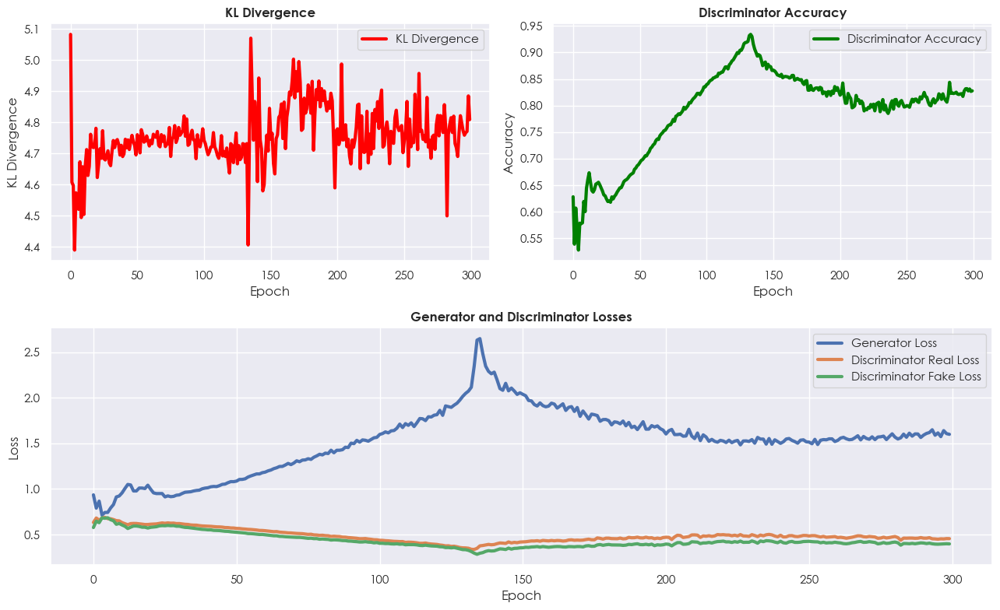

In [116]:
plot_model_performance(history)

**LOADING AND TESTING THE GENERATOR WEIGHTS ON SYNTHETIC IMAGES**

In [151]:
# Loading and testing the generator's weights
generator.load_weights('modelweights/tuned_cdcgan/epoch_300/generator_weights_epoch_300.h5')
generator.summary()

Model: "Improved_cDCGAN_Generator"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Noise_Input (InputLayer)       [(None, 128)]        0           []                               
                                                                                                  
 Label_Input (InputLayer)       [(None, 1)]          0           []                               
                                                                                                  
 Noise_Dense (Dense)            (None, 2048)         264192      ['Noise_Input[0][0]']            
                                                                                                  
 Label_Embedding (Embedding)    (None, 1, 50)        500         ['Label_Input[0][0]']            
                                                                          

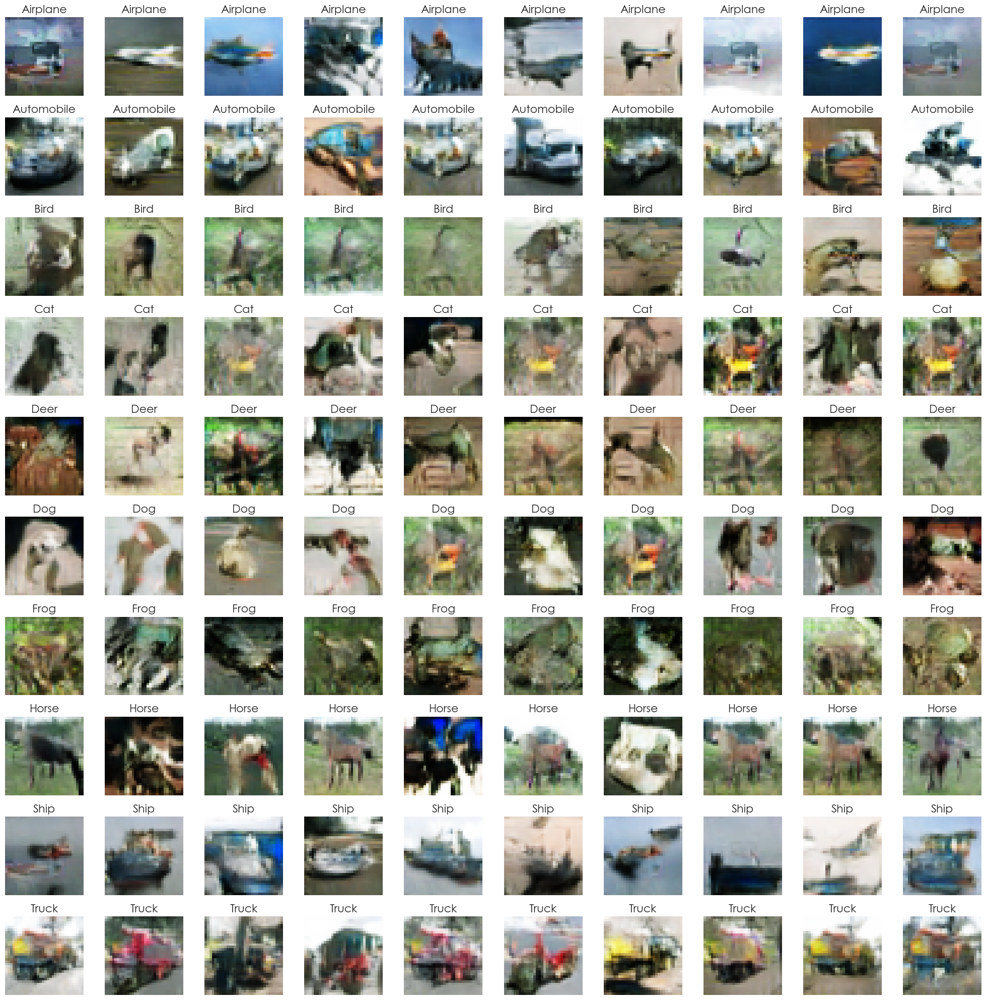

In [152]:
# Generate random latent vectors and class labels
latent_vectors = tf.random.normal(shape=(100, LATENT_DIM))
class_labels = tf.reshape(tf.range(10), shape=(10, 1))
class_labels = tf.tile(class_labels, multiples=(1, 10))
class_labels = tf.reshape(class_labels, shape=(100, 1))

# Generate images using the loaded generator
generated_images = generator([latent_vectors, class_labels], training=False)
generated_images = (generated_images + 1) / 2

# Create a dictionary to map class labels to their corresponding names
label_map = {
    0: 'Airplane',
    1: 'Automobile',
    2: 'Bird',
    3: 'Cat',
    4: 'Deer',
    5: 'Dog',
    6: 'Frog',
    7: 'Horse',
    8: 'Ship',
    9: 'Truck'
}

# Create a grid of subplots and display generated images with labels
fig, axes = plt.subplots(10, 10, figsize=(20, 20))
axes = axes.flatten()

for i, ax in enumerate(axes):
    ax.imshow(generated_images[i], cmap='gray')
    ax.set_title(label_map[class_labels[i].numpy().item()], fontsize=16)
    ax.axis('off')

plt.tight_layout()
plt.show()

**STORING LATENT SPACE EVOLUTION OF IMAGES FOR TUNED cDCGAN MODEL**

In [145]:
# Check if the directory exists, and create it if it doesn't
directory_path = './animation/tuned_cdcgan'
if not os.path.exists(directory_path):
    os.makedirs(directory_path)

# Collect image paths
images = [] 
gan_img_paths = glob.glob("./images/tuned_cdcgan_images/*.png") 

# Load images
for path in gan_img_paths: 
    images.append(imageio.imread(path)) 
    
# Save the GIF in the created directory
imageio.mimsave(os.path.join(directory_path, 'TUNEDCDCGAN.gif'), images, duration=0.2)
filename=os.path.join(directory_path, 'TUNEDCDCGAN.gif')

# Display the GIF
display_gif(filename)

### ANALYSIS OF MODEL BUILDING PROCESS AND IMPROVEMENT

**Was applying BatchNormalization, PreLU, and Gaussian Weight Initialization helpful?**

- From our model improvement of running 300 epochs, we can see that the images generated by the improved model was actually relatively decent, as we can roughly make out what some of the images are (more so for vehicles).
- However, when comparing to our original cDCGAN model, that model architecture managed to achieve slightly better FID and Inception Scores, although the difference is minimal. Yet, one thing to note for this model is that it experienced a collapse around epoch 140 as the losses began to diverge and the quality of the images worsened (which was not as evident from our original cDCGAN model.
- Also, looking at the KL Divergence values, we see that the values seem to stabilize but do not show a clear downward trend, suggesting that the generator is not consistently improving towards producing data with a distribution that closely matches the real data.

Hence, although the images generated by our improved cDCGAN model are decent, the metrics tell us that the best model we have developed would be our original cDCGAN model + Gradient Penalty, which was improved upon the baseline DCGAN model. So, for displaying our final 1000 colour images from CIFAR-10, we will be using the **original cDCGAN model with gradient penalty**.

### DISPLAYING OF FINAL 1000 COLOUR IMAGES FROM CIFAR-10 

- After obtaining our best model, we will finally be displaying 1000 colour images from our CIFAR-10 Dataset, and we have segmented these images into 100 per class to be able to show the quality of our images from each of the classes.
- To show these images, we will load our best generator weights and generate the respective images using our best model weights obtained from our model development and improvement processes earlier.

**RE-INITIALIZING THE GENERATOR FUNCTION FOR EVALUATION**

In [173]:
def create_generator(latent_dim):
    # foundation for label embeedded input
    label_input = Input(shape=(1,), name='Label_Input')
    label_embedding = Embedding(10, 10, name='Label_Embedding')(label_input)
    
    # linear activation
    label_embedding = Dense(4 * 4, name='Label_Dense')(label_embedding)

    # reshape to additional channel
    label_embedding = Reshape((4, 4, 1), name='Label_Reshape')(label_embedding)

    # foundation for 4x4 image input
    noise_input = Input(shape=(latent_dim,), name='Noise_Input')
    noise_dense = Dense(4 * 4 * 128, name='Noise_Dense')(noise_input)
    noise_dense = ReLU(name='Noise_ReLU')(noise_dense)
    noise_reshape = Reshape((4, 4, 128), name='Noise_Reshape')(noise_dense)

    # concatenate label embedding and image to produce 129-channel output
    concat = Concatenate(name='Concatenate')([noise_reshape, label_embedding])

    # upsample to 8x8
    conv1 = Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same', name='Conv1')(concat)
    conv1 = ReLU(name='Conv1_ReLU')(conv1)

    # upsample to 16x16
    conv2 = Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same', name='Conv2')(conv1)
    conv2 = ReLU(name='Conv2_ReLU')(conv2)

    # upsample to 32x32
    conv3 = Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same', name='Conv3')(conv2)
    conv3 = ReLU(name='Conv3_ReLU')(conv3)

    # output 32x32x3
    output = Conv2D(3, (3, 3), activation='tanh', padding='same', name='Output')(conv3)
    model = Model(inputs=[noise_input, label_input], outputs=output, name='cDCGAN_Generator')

    return model

**LOADING WEIGHTS FOR THE MODELS**

In [174]:
weights = 'modelweights/cdcgan/epoch_200/generator_weights_epoch_200.h5'
latent_dim = 128
label_map = {
    0: 'Airplane',
    1: 'Automobile',
    2: 'Bird',
    3: 'Cat',
    4: 'Deer',
    5: 'Dog',
    6: 'Frog',
    7: 'Horse',
    8: 'Ship',
    9: 'Truck'
}
trained_generator = create_generator(latent_dim)
trained_generator.load_weights(weights)

In [175]:
# create tensor with 100 1s
airplane = tf.zeros(shape=(100,), dtype=tf.int32)
automobile = tf.ones(shape=(100,), dtype=tf.int32)
bird = tf.fill(dims=(100,), value=2)
cat = tf.fill(dims=(100,), value=3)
deer = tf.fill(dims=(100,), value=4)
dog = tf.fill(dims=(100,), value=5)
frog = tf.fill(dims=(100,), value=6)
horse = tf.fill(dims=(100,), value=7)
ship = tf.fill(dims=(100,), value=8)
truck = tf.fill(dims=(100,), value=9)

# reshape to 10x10
airplane = tf.reshape(airplane, shape=(100, 1))
automobile = tf.reshape(automobile, shape=(100, 1))
bird = tf.reshape(bird, shape=(100, 1))
cat = tf.reshape(cat, shape=(100, 1))
deer = tf.reshape(deer, shape=(100, 1))
dog = tf.reshape(dog, shape=(100, 1))
frog = tf.reshape(frog, shape=(100, 1))
horse = tf.reshape(horse, shape=(100, 1))
ship = tf.reshape(ship, shape=(100, 1))
truck = tf.reshape(truck, shape=(100, 1))

In [176]:
# Prepare images
generated_airplanes = trained_generator([tf.random.normal(shape=(100, latent_dim)), airplane], training=False)
generated_auto = trained_generator([tf.random.normal(shape=(100, latent_dim)), automobile], training=False)
generated_bird = trained_generator([tf.random.normal(shape=(100, latent_dim)), bird], training=False)
generated_cat = trained_generator([tf.random.normal(shape=(100, latent_dim)), cat], training=False)
generated_deer = trained_generator([tf.random.normal(shape=(100, latent_dim)), deer], training=False)
generated_dog = trained_generator([tf.random.normal(shape=(100, latent_dim)), dog], training=False)
generated_frog = trained_generator([tf.random.normal(shape=(100, latent_dim)), frog], training=False)
generated_horse = trained_generator([tf.random.normal(shape=(100, latent_dim)), horse], training=False)
generated_ship = trained_generator([tf.random.normal(shape=(100, latent_dim)), ship], training=False)
generated_truck = trained_generator([tf.random.normal(shape=(100, latent_dim)), truck], training=False)

# rescale to 0-1
generated_airplanes = (generated_airplanes + 1) / 2
generated_auto = (generated_auto + 1) / 2
generated_bird = (generated_bird + 1) / 2
generated_cat = (generated_cat + 1) / 2
generated_deer = (generated_deer + 1) / 2
generated_dog = (generated_dog + 1) / 2
generated_frog = (generated_frog + 1) / 2
generated_horse = (generated_horse + 1) / 2
generated_ship = (generated_ship + 1) / 2
generated_truck = (generated_truck + 1) / 2

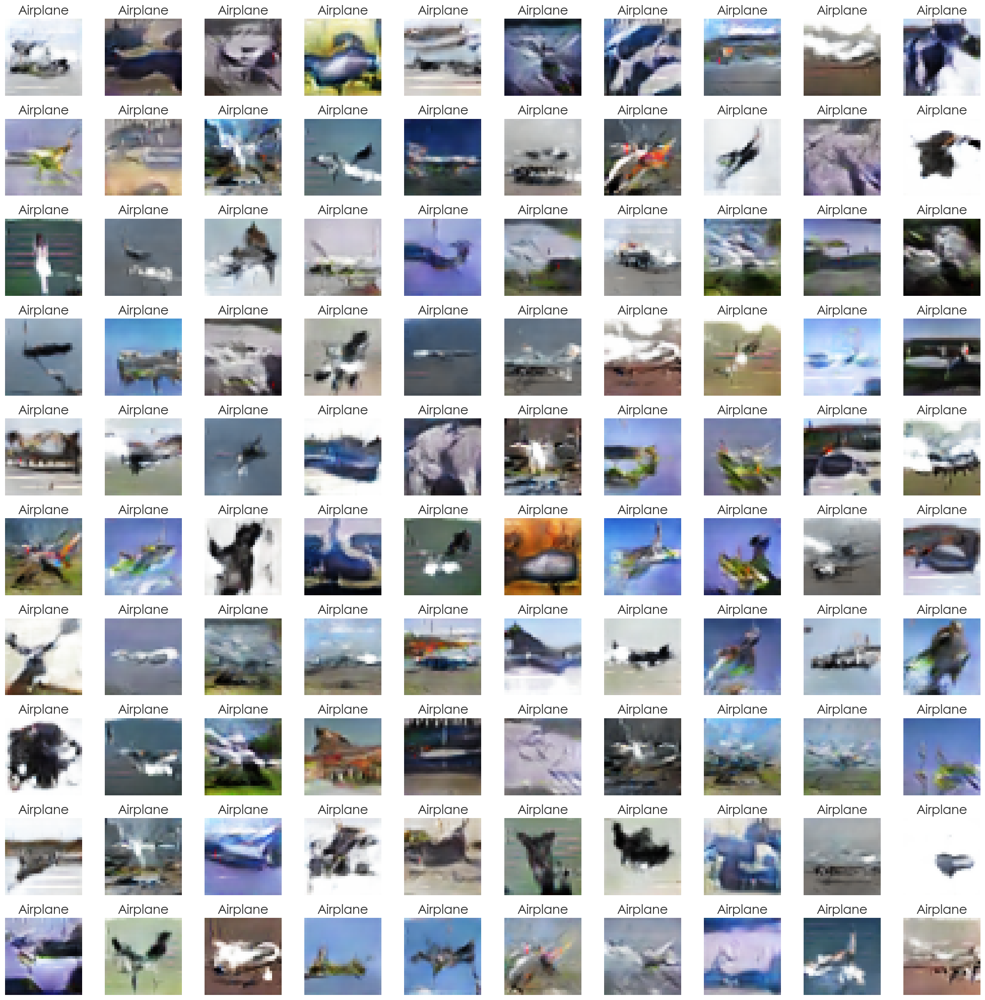

In [177]:
fig, axes = plt.subplots(10, 10, figsize=(20, 20))
axes = axes.flatten()

for i, ax in enumerate(axes):
    ax.imshow(generated_airplanes[i])
    ax.set_title('Airplane', fontsize=18)
    ax.axis('off')

plt.tight_layout()
plt.show()

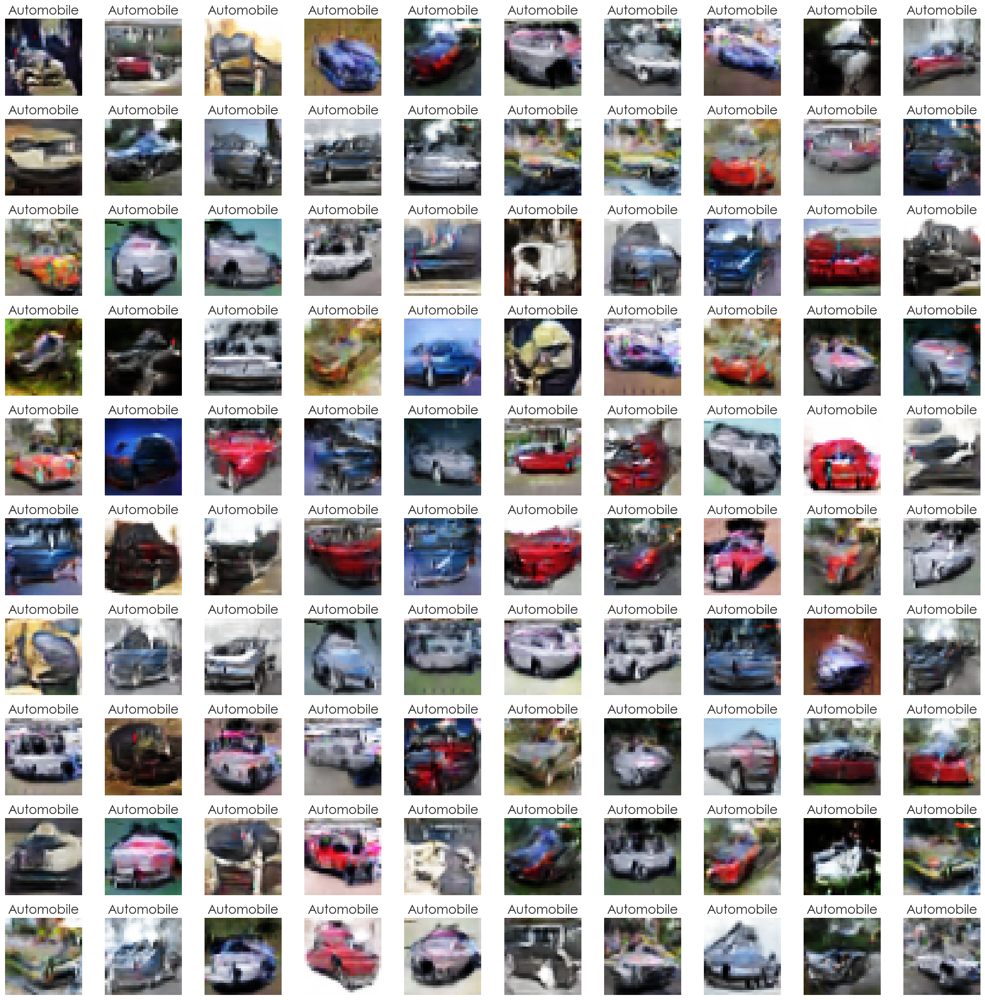

In [178]:
fig, axes = plt.subplots(10, 10, figsize=(20, 20))
axes = axes.flatten()

for i, ax in enumerate(axes):
    ax.imshow(generated_auto[i])
    ax.set_title('Automobile', fontsize=18)
    ax.axis('off')

plt.tight_layout()
plt.show()

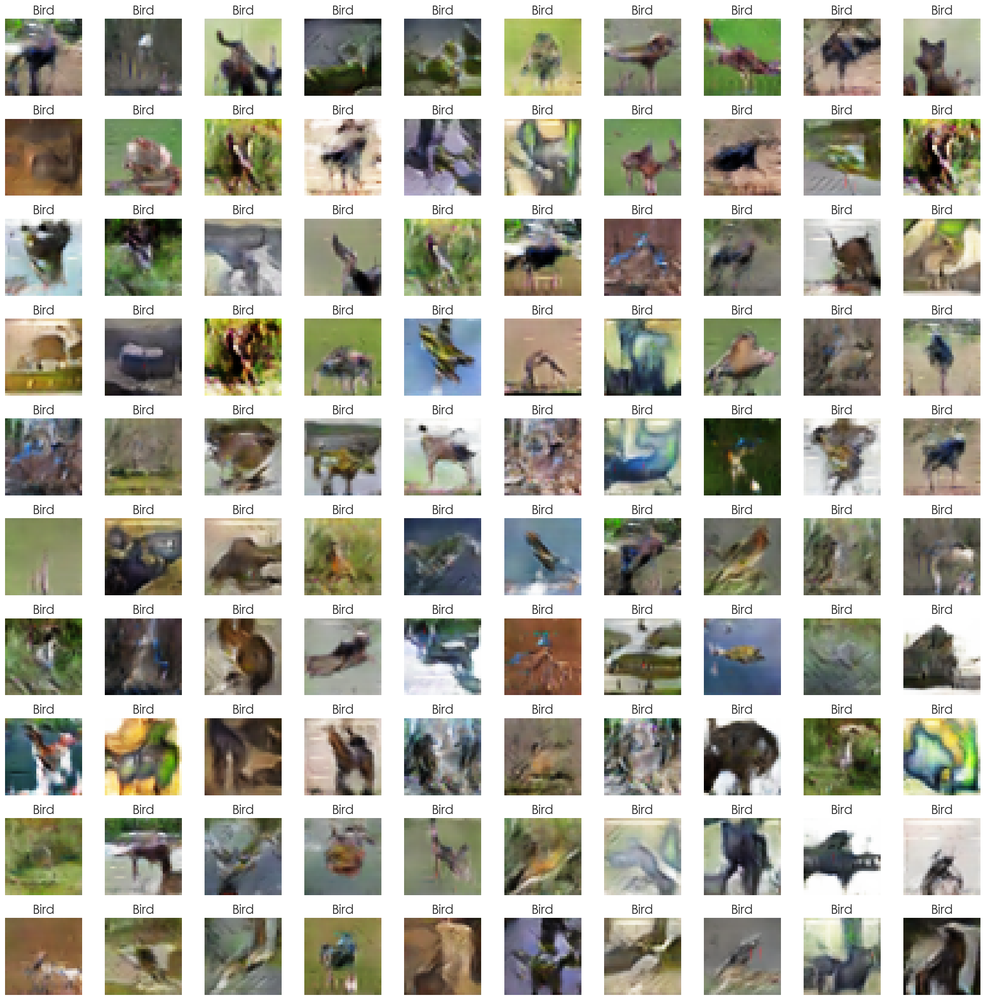

In [179]:
fig, axes = plt.subplots(10, 10, figsize=(20, 20))
axes = axes.flatten()

for i, ax in enumerate(axes):
    ax.imshow(generated_bird[i])
    ax.set_title('Bird', fontsize=18)
    ax.axis('off')

plt.tight_layout()
plt.show()

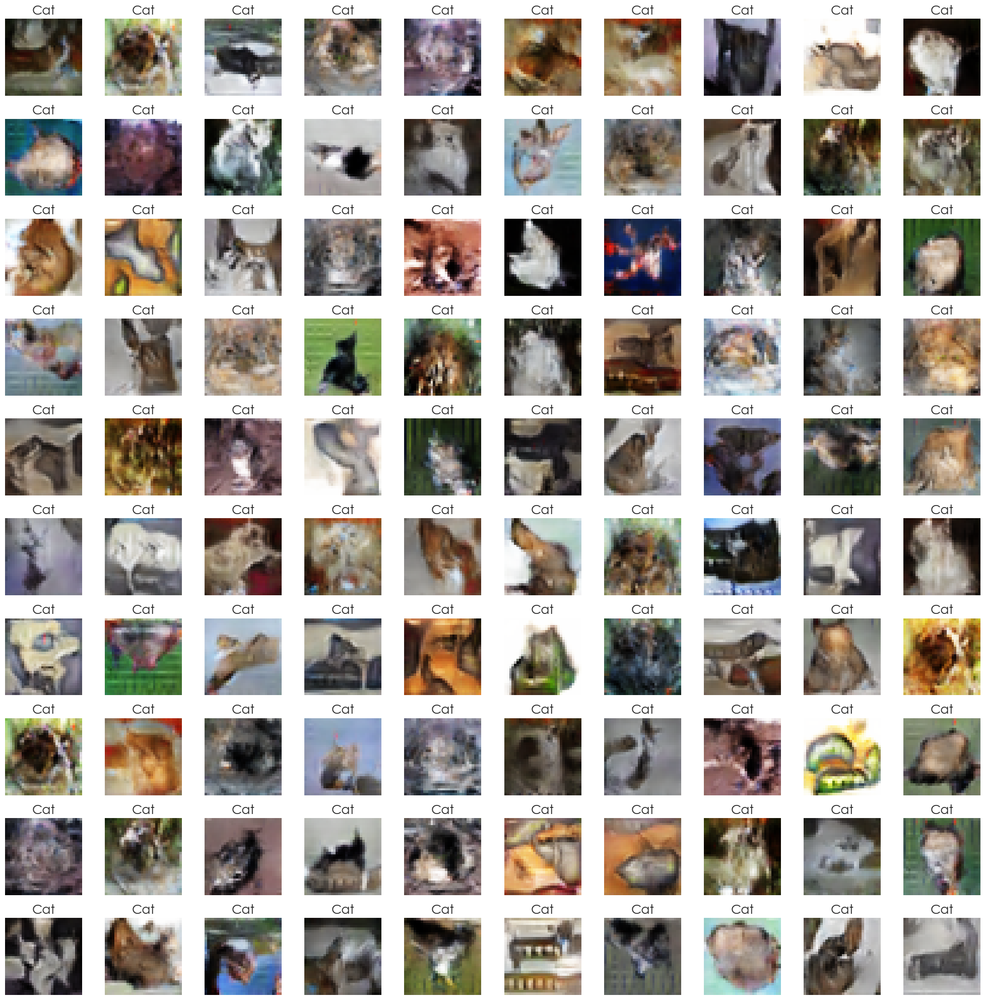

In [180]:
fig, axes = plt.subplots(10, 10, figsize=(20, 20))
axes = axes.flatten()

for i, ax in enumerate(axes):
    ax.imshow(generated_cat[i])
    ax.set_title('Cat', fontsize=18)
    ax.axis('off')

plt.tight_layout()
plt.show()

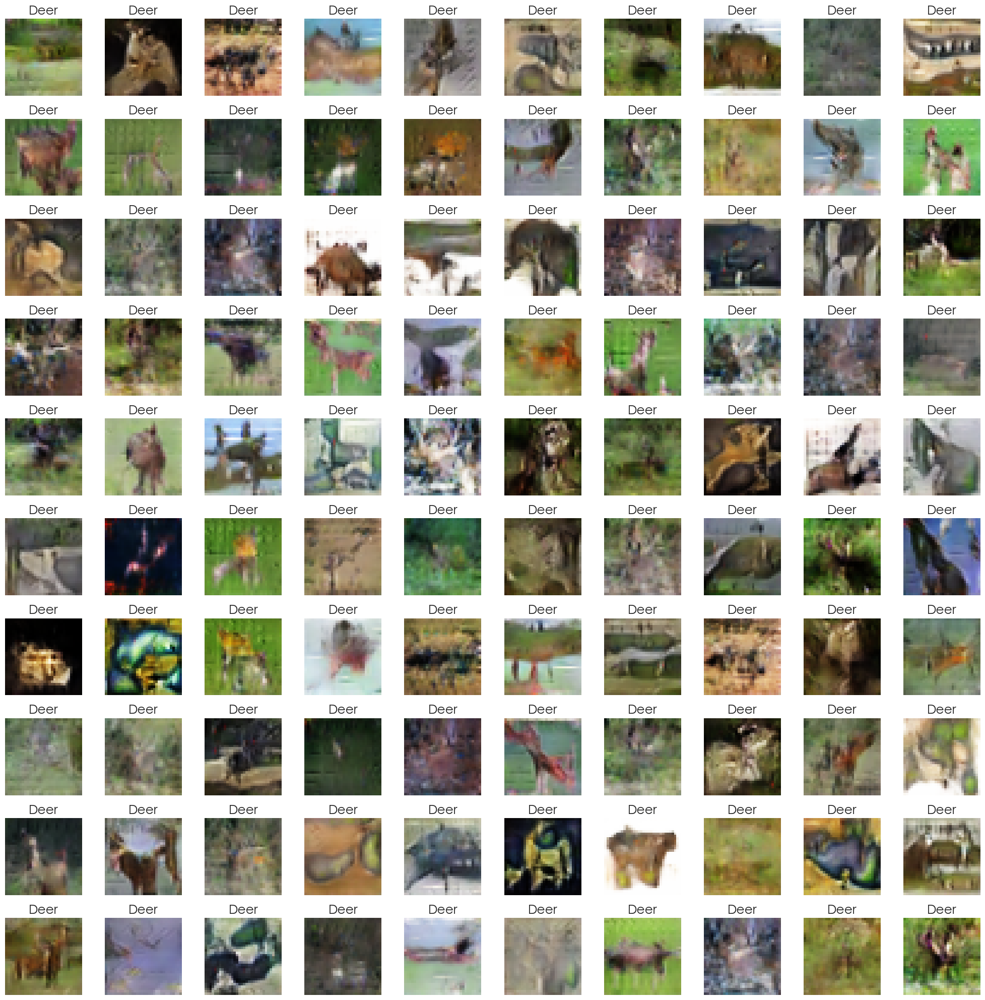

In [181]:
fig, axes = plt.subplots(10, 10, figsize=(20, 20))
axes = axes.flatten()

for i, ax in enumerate(axes):
    ax.imshow(generated_deer[i])
    ax.set_title('Deer', fontsize=18)
    ax.axis('off')

plt.tight_layout()
plt.show()

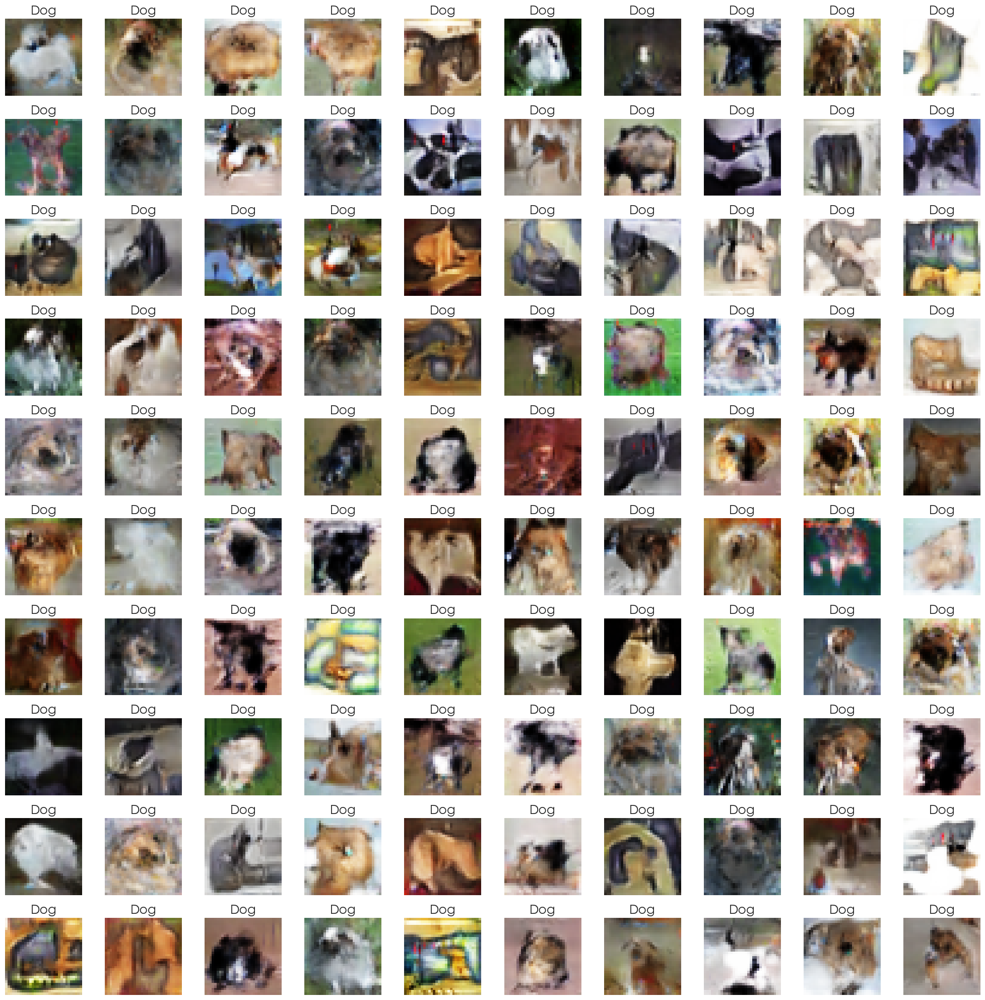

In [182]:
fig, axes = plt.subplots(10, 10, figsize=(20, 20))
axes = axes.flatten()

for i, ax in enumerate(axes):
    ax.imshow(generated_dog[i])
    ax.set_title('Dog', fontsize=18)
    ax.axis('off')

plt.tight_layout()
plt.show()

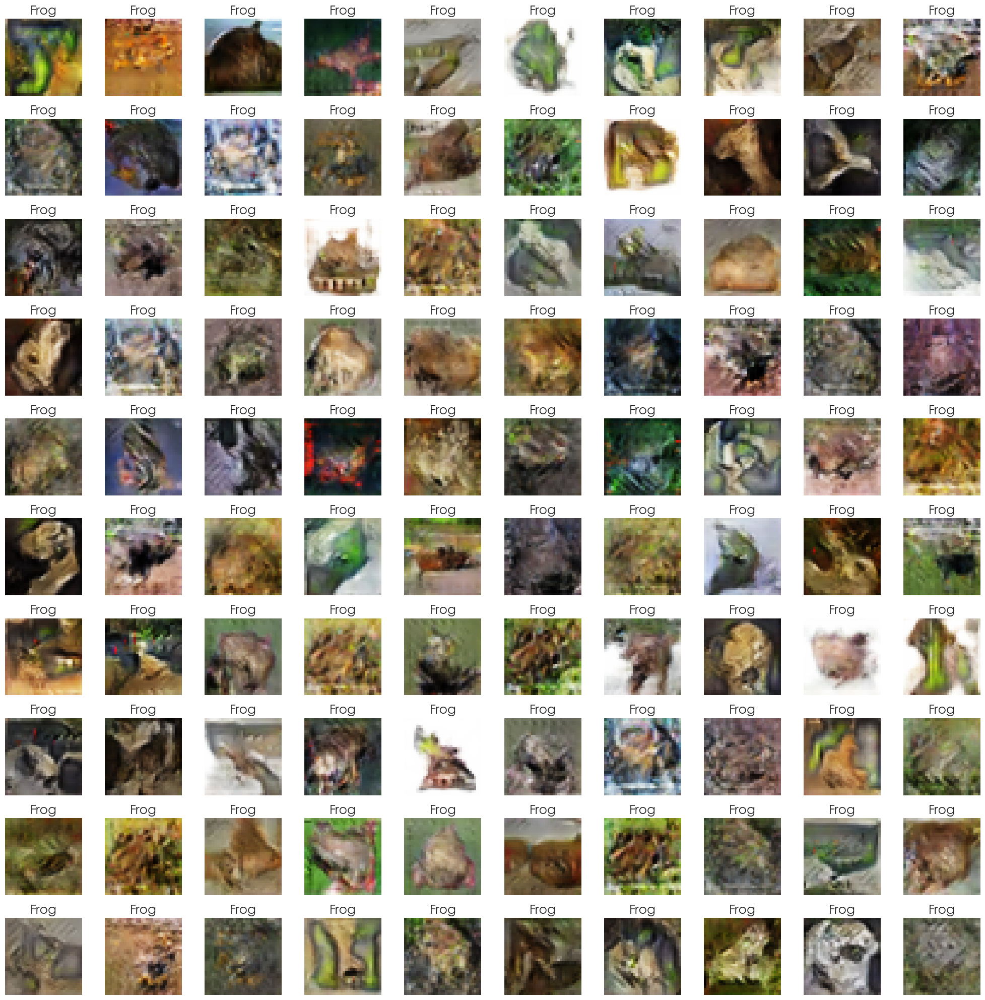

In [183]:
fig, axes = plt.subplots(10, 10, figsize=(20, 20))
axes = axes.flatten()

for i, ax in enumerate(axes):
    ax.imshow(generated_frog[i])
    ax.set_title('Frog', fontsize=18)
    ax.axis('off')

plt.tight_layout()
plt.show()

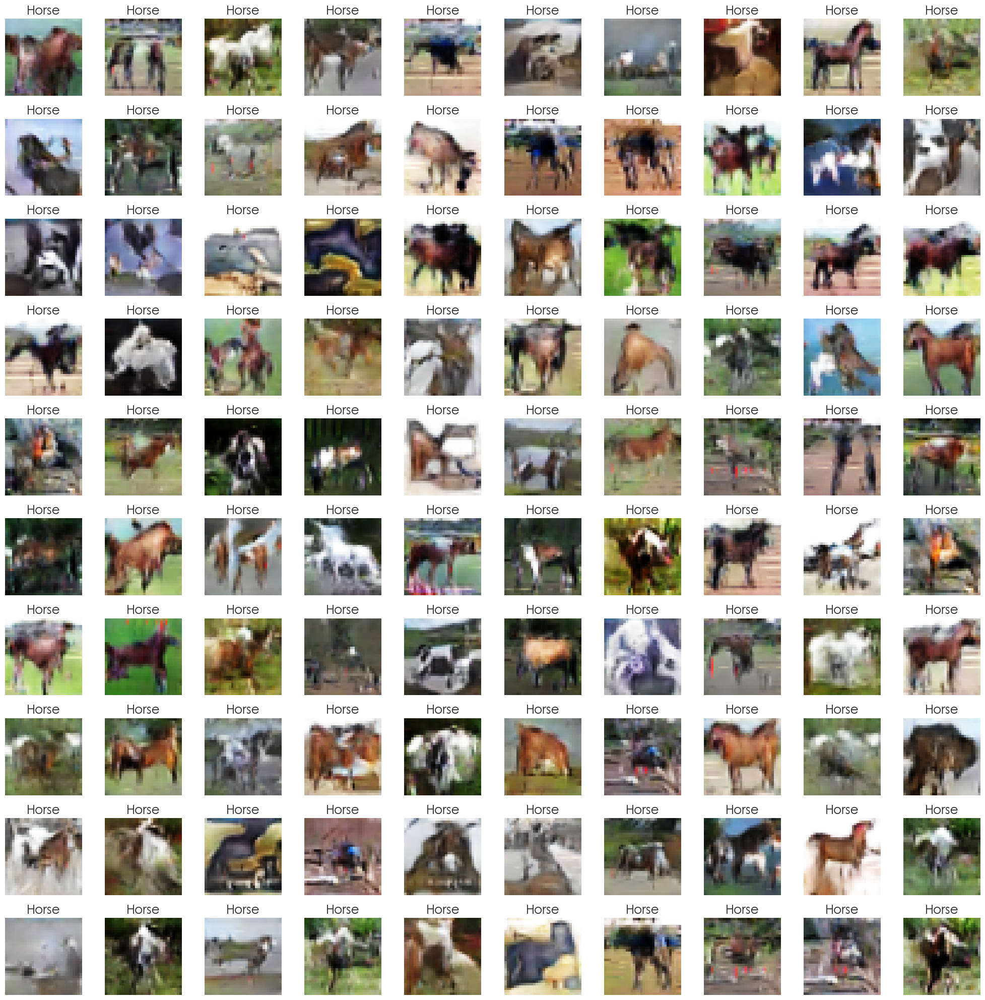

In [184]:
fig, axes = plt.subplots(10, 10, figsize=(20, 20))
axes = axes.flatten()

for i, ax in enumerate(axes):
    ax.imshow(generated_horse[i])
    ax.set_title('Horse', fontsize=18)
    ax.axis('off')

plt.tight_layout()
plt.show()

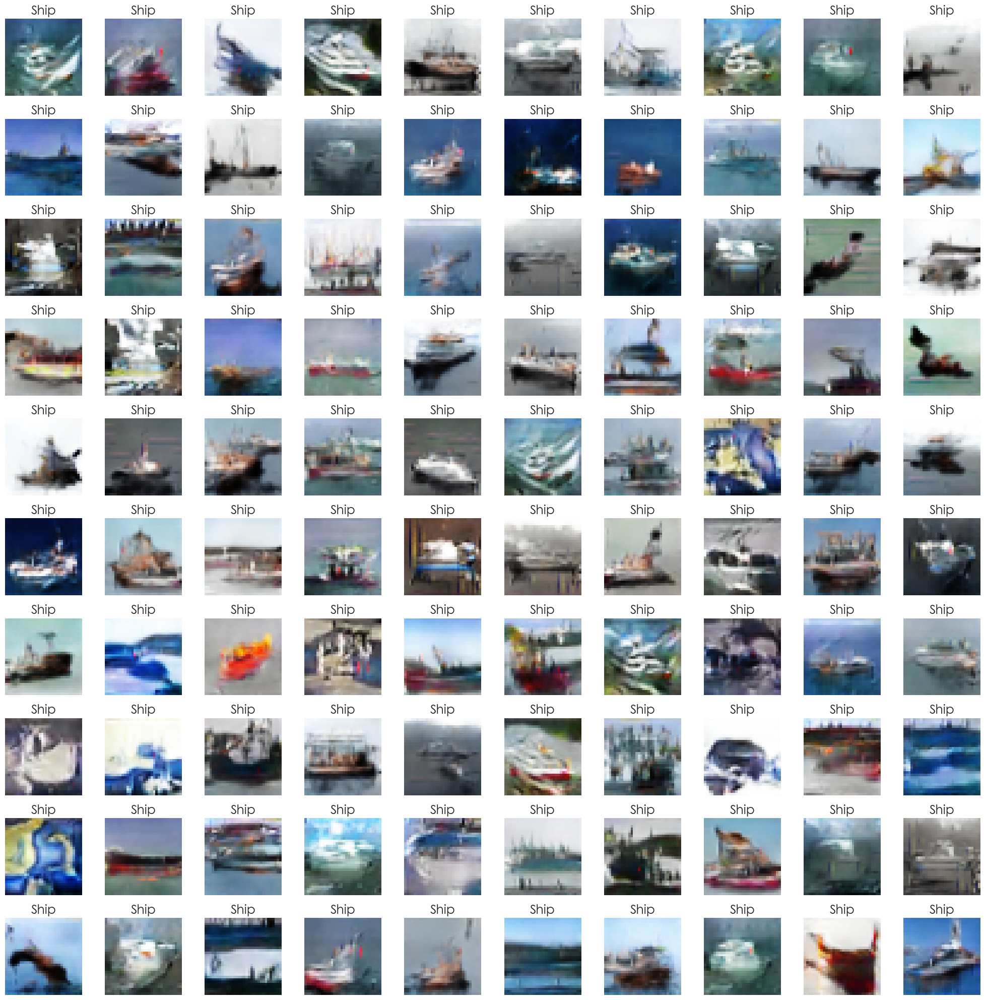

In [185]:
fig, axes = plt.subplots(10, 10, figsize=(20, 20))
axes = axes.flatten()

for i, ax in enumerate(axes):
    ax.imshow(generated_ship[i])
    ax.set_title('Ship', fontsize=18)
    ax.axis('off')

plt.tight_layout()
plt.show()

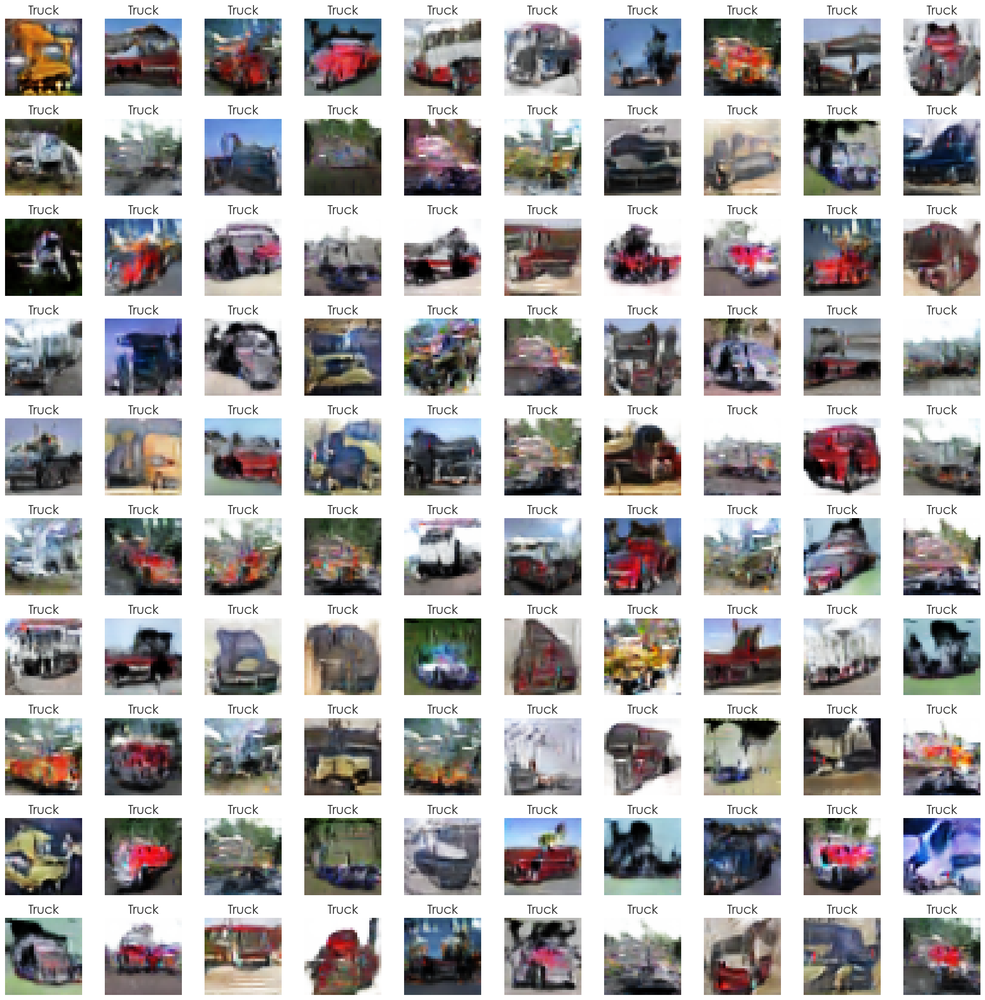

In [186]:
fig, axes = plt.subplots(10, 10, figsize=(20, 20))
axes = axes.flatten()

for i, ax in enumerate(axes):
    ax.imshow(generated_truck[i])
    ax.set_title('Truck', fontsize=18)
    ax.axis('off')

plt.tight_layout()
plt.show()

### ANALYSIS OF FINAL IMAGES GENERATED

Upon generating all our images, we can see that many of the images are actually fairly realistic, but some of the images still contain distorted features that causes the images to be less distinct when comparing by class.

There have been some issues noted with the images generated by our models.

- Some of the wheels of the vehicles are warped.
- Some of the animals like the horses and deer have very thin or fat bodies.
- Some of the images are somewhat corrupted by the background and noise.
- Many of the animals also show weird animal parts being combined together.

**INTERESTING INSIGHT FROM IMAGES GENERATED :**

Something interesting to note is that our model performed better at generating vehicles (i.e. trucks, ships, automobiles etc.) as compared to the animal classes like cats and dogs. Although our model managed to learn the shape and texture of the animal relatively well, some of the shapes are still warped. This is likely due to the variety of images and styles that the classes have and the model could have a hard time trying to form the parts of the animal.

### CONCLUSION OF GAN ANALYSIS : CIFAR-10 DATASET

From our analysis with Generative Adversarial Networks for the CIFAR-10 Colored Images Dataset, we can conclude the following :

1. **Generating animals poses a greater challenge.**

We've observed that when it comes to the 10 distinct classes, generating non-living objects like vehicles is notably more straightforward compared to generating animals from the dataset. One reason for this could be that vehicles, such as trucks and automobiles, tend to have more angular or cuboid shapes, and they share relatively consistent features across real images in the dataset. In contrast, reproducing the intricate details of animals seems to be a more complex task, with some generated images only capturing plausible colors, textures, or shapes of the subject but not all of these aspects simultaneously. This challenge may stem from the significant variation among training examples within each animal class, as different animal breeds can exhibit very distinct features within their broader class categories.

2. **Enhancing Conditional Image Synthesis and Normalization**

We can exert control over the class or properties of the generated images by incorporating class label information during training. Previous experiments with other GAN variants, like the AC-GAN, have demonstrated increased stability in training when auxiliary information is included. Therefore, it would be beneficial to explore GAN architectures that offer more fine-grained control over both the class and style of the synthesized images, such as the InfoGAN proposed by Chen et al. in 2016. Additionally, further investigations can be conducted into the use of normalization techniques for the discriminator, such as instance normalization, as spectral normalization has proven to be effective in stabilizing training.

3. **Potential for Future Enhancements**

Given additional time and resources, I would consider experimenting with concepts borrowed from reinforcement learning. This might involve implementing techniques like experience replay, where previously generated images are occasionally introduced into the training process to be discriminated. Other stability-enhancing tricks used in reinforcement learning, as described by Pfau and Vinyals in 2017, could also be explored to potentially improve GAN training and performance.